# Project 3 - PCA project comut and spatial analysis
# Author: Yingxiao Shi(TK)
# Date: 02132024
# Environment: 

In [2]:

# Import libraries

import sys
import os
import anndata as ad
import pandas as pd
import scanpy as sc
import seaborn as sns; sns.set(color_codes = True)
import matplotlib as mpl
import matplotlib.pyplot as plt



import seaborn as sns

from scipy.stats import ttest_ind
import statistics

import seaborn as sns; sns.set(color_codes = True)
import random

# import the data for the distribution
import numpy as np
from scipy.stats import gaussian_kde

# import scimap

from sklearn.cluster import DBSCAN
from sklearn.neighbors import NearestNeighbors
# look at MPIscore correction
import matplotlib.colors as mcolors


import spatialcells as spc
print(spc.__version__)

# set up the graph parameter
mpl.rcParams['figure.facecolor'] = 'white'
plt.rcParams['figure.facecolor'] = 'white'
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams['font.sans-serif'] = 'Arial'
plt.rc('font', size=14)
plt.rcParams['pdf.fonttype'] = 42

import scimap as sm

ModuleNotFoundError: No module named 'spatialcells'

In [2]:
np.random.seed(42)
print(ad.__version__)

0.10.9


In [3]:
print(spc.__version__)

1.0.1


# load the annotation data for CoMut Plot

In [ ]:
#!pip install comut

  Using cached comut-0.0.3-py3-none-any.whl.metadata (2.9 kB)
  Using cached palettable-3.3.3-py2.py3-none-any.whl.metadata (3.3 kB)
Using cached comut-0.0.3-py3-none-any.whl (18 kB)
Using cached palettable-3.3.3-py2.py3-none-any.whl (332 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2/2 [comut]able]


In [8]:
os.getcwd()

'/Users/yshi797/Desktop/PCA'

In [9]:
annotation = pd.read_csv("PCA_II_merged_cohort_clinical_annotations_09052024_main_figure_Set_added.csv", sep = ",")
annotation.head()

,Case,Breslow (mm),Stage,GeoMx,CyCIF e24 cy13,CyCIF e41,CyCIF stage II,Set,Normal,Precursor,MIS,RGP,VGP,TILs
0,MEL31,0.0,0,not available,not available,available,not available,Set_A,Absent,Absent,Present,Absent,Absent,not applicable
1,MEL15,0.7,IA,available,not available,not available,not available,Set_A,Present,Present,Present,Absent,Absent,brisk
2,MEL16,0.5,IA,available,not available,not available,not available,Set_A,Present,Present,Present,Absent,Present,brisk
3,MEL17,0.6,IA,available,available,not available,not available,Set_A,Present,Present,Absent,Absent,Absent,non-brisk
4,MEL34,0.0,0,available,not available,available,not available,Set_A,Present,Present,Present,Absent,Absent,not applicable


In [10]:
# install the comut
#!pip install comut
from comut import comut
from comut import fileparsers
import palettable
import matplotlib.pyplot as plt
%matplotlib inline
%config InlineBackend.figure_format = 'retina'


# Creating the basic comut

In [11]:
annotation.VGP.value_counts()

VGP
Present    50
Absent     12
Name: count, dtype: int64

In [12]:
annotation

,Case,Breslow (mm),Stage,GeoMx,CyCIF e24 cy13,CyCIF e41,CyCIF stage II,Set,Normal,Precursor,MIS,RGP,VGP,TILs
0,MEL31,0.0,0,not available,not available,available,not available,Set_A,Absent,Absent,Present,Absent,Absent,not applicable
1,MEL15,0.7,IA,available,not available,not available,not available,Set_A,Present,Present,Present,Absent,Absent,brisk
2,MEL16,0.5,IA,available,not available,not available,not available,Set_A,Present,Present,Present,Absent,Present,brisk
3,MEL17,0.6,IA,available,available,not available,not available,Set_A,Present,Present,Absent,Absent,Absent,non-brisk
4,MEL34,0.0,0,available,not available,available,not available,Set_A,Present,Present,Present,Absent,Absent,not applicable
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,MEL82,9.0,IIB,available,not available,not available,available,Set_B,Absent,Absent,Absent,Absent,Present,non brisk
58,MEL83,4.8,IIB,available,not available,not available,not available,Set_B,Absent,Present,Absent,Present,Present,non brisk
59,MEL84,3.2,IIA,available,not available,not available,available,Set_B,Absent,Absent,Absent,Absent,Present,non brisk
60,MEL85,2.4,IIA,available,not available,not available,available,Set_B,Present,Absent,Absent,Absent,Present,non brisk


In [13]:
annotation[["CyCIF e24 cy13", "CyCIF e41", "CyCIF stage II"]].head()


,CyCIF e24 cy13,CyCIF e41,CyCIF stage II
0,not available,available,not available
1,not available,not available,not available
2,not available,not available,not available
3,available,not available,not available
4,not available,available,not available


In [14]:
annotation[["CyCIF e24 cy13", "CyCIF e41"]].head()

# define a function to make the annotation easy
def determine_cycif(row):
    if row["CyCIF e24 cy13"] == "available":
        return "Batch_e24"
    elif row["CyCIF e41"] == "available":
        return "Batch_e41"
    elif row["CyCIF stage II"] == "available":
        return "Batch_stage2"
    else:
        return "not available"  # or whatever you want as default

annotation["CyCIF"] = annotation.apply(determine_cycif, axis = 1)
annotation["CyCIF"].value_counts()

CyCIF
Batch_e24        22
not available    14
Batch_e41        13
Batch_stage2     13
Name: count, dtype: int64

In [15]:
annotation

,Case,Breslow (mm),Stage,GeoMx,CyCIF e24 cy13,CyCIF e41,CyCIF stage II,Set,Normal,Precursor,MIS,RGP,VGP,TILs,CyCIF
0,MEL31,0.0,0,not available,not available,available,not available,Set_A,Absent,Absent,Present,Absent,Absent,not applicable,Batch_e41
1,MEL15,0.7,IA,available,not available,not available,not available,Set_A,Present,Present,Present,Absent,Absent,brisk,not available
2,MEL16,0.5,IA,available,not available,not available,not available,Set_A,Present,Present,Present,Absent,Present,brisk,not available
3,MEL17,0.6,IA,available,available,not available,not available,Set_A,Present,Present,Absent,Absent,Absent,non-brisk,Batch_e24
4,MEL34,0.0,0,available,not available,available,not available,Set_A,Present,Present,Present,Absent,Absent,not applicable,Batch_e41
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57,MEL82,9.0,IIB,available,not available,not available,available,Set_B,Absent,Absent,Absent,Absent,Present,non brisk,Batch_stage2
58,MEL83,4.8,IIB,available,not available,not available,not available,Set_B,Absent,Present,Absent,Present,Present,non brisk,not available
59,MEL84,3.2,IIA,available,not available,not available,available,Set_B,Absent,Absent,Absent,Absent,Present,non brisk,Batch_stage2
60,MEL85,2.4,IIA,available,not available,not available,available,Set_B,Present,Absent,Absent,Absent,Present,non brisk,Batch_stage2


In [16]:
# reorder annotation data
annotation[["Stage", "Breslow (mm)"]]

stage_order = ["0", "IA", "IB", "IIA", "IIB", "IIC", "III"]

# convert stage column to a categorical type with the specific order
annotation["Stage"] = pd.Categorical(annotation["Stage"], categories = stage_order, ordered= True)
annotation_sorted = annotation.sort_values(by=["Set", "Stage", "Breslow (mm)"], ascending=[True, True, True])
annotation_sorted




,Case,Breslow (mm),Stage,GeoMx,CyCIF e24 cy13,CyCIF e41,CyCIF stage II,Set,Normal,Precursor,MIS,RGP,VGP,TILs,CyCIF
0,MEL31,0.0,0,not available,not available,available,not available,Set_A,Absent,Absent,Present,Absent,Absent,not applicable,Batch_e41
4,MEL34,0.0,0,available,not available,available,not available,Set_A,Present,Present,Present,Absent,Absent,not applicable,Batch_e41
5,MEL35,0.0,0,available,available,available,not available,Set_A,Present,Present,Present,Absent,Absent,not applicable,Batch_e24
7,MEL39,0.0,0,available,available,available,not available,Set_A,Present,Present,Present,Absent,Absent,not applicable,Batch_e24
13,MEL29,0.0,0,available,not available,not available,not available,Set_A,Absent,Present,Present,Absent,Absent,not applicable,not available
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47,MEL72,16.0,IIB,available,not available,not available,available,Set_B,Absent,Present,Absent,Absent,Present,non brisk,Batch_stage2
48,MEL73,2.7,IIC,available,not available,not available,available,Set_B,Absent,Absent,Absent,Absent,Present,brisk,Batch_stage2
50,MEL75,4.2,IIC,available,not available,not available,available,Set_B,Present,Absent,Absent,Absent,Present,absent,Batch_stage2
49,MEL74,5.4,IIC,available,not available,not available,available,Set_B,Absent,Present,Absent,Absent,Present,non brisk,Batch_stage2


In [17]:
annotation_sorted.Set.value_counts()

Set
Set_A    45
Set_B    17
Name: count, dtype: int64

In [18]:
# organize the data
# VGP
# VGP
VGPdata = annotation_sorted[["Case", "VGP"]].rename(columns = {"Case": "sample", "VGP": "value"})
VGPdata = VGPdata.replace({"Present": "present", "Absent": "absent"})
VGPdata["category"] = "VGP"

# RGP
RGPdata = annotation_sorted[["Case", "RGP"]].rename(columns = {"Case": "sample", "RGP": "value"})
RGPdata = RGPdata.replace({"Present": "present", "Absent": "absent"})
RGPdata["category"] = "RGP"
RGPdata.head()

# MIS
MISdata = annotation_sorted[["Case", "MIS"]].rename(columns = {"Case": "sample", "MIS": "value"})
MISdata = MISdata.replace({"Present": "present", "Absent": "absent"})
MISdata["category"] = "MIS"
MISdata.head()

# Precusor 
Pdata = annotation_sorted[["Case", "Precursor"]].rename(columns = {"Case": "sample", "Precursor": "value"})
Pdata = Pdata.replace({"Present": "present", "Absent": "absent"})
Pdata["category"] = "Precursor"
Pdata.head()


# Normal
Ndata = annotation_sorted[["Case", "Normal"]].rename(columns = {"Case": "sample", "Normal": "value"})
Ndata = Ndata.replace({"Present": "present", "Absent": "absent"})
Ndata["category"] = "Normal"
Ndata.head()

#annotation["CyCIF"].value_counts()
CyCIFdata = annotation_sorted[["Case", "CyCIF"]]
CyCIFdata["CyCIFcombined"] = "others"
CyCIFdata.loc[CyCIFdata["CyCIF"].isin(["Batch_e24", "Batch_e41", "Batch_stage2"]), "CyCIFcombined"] = "available"
CyCIFdata.loc[CyCIFdata["CyCIF"] == "not available", "CyCIFcombined"] = "not available"

CyCIFdata["CyCIFcombined"].value_counts()
CyCIFdata = CyCIFdata[["Case", "CyCIFcombined"]].rename(columns = {"Case": "sample", "CyCIFcombined": "value"})
CyCIFdata["category"] = "CyCIF"

# GeoMX
annotation_sorted.loc[annotation_sorted["CyCIF"] == "Batch_stage2", "GeoMx"] = "not available"

GeoMXdata = annotation_sorted[["Case", "GeoMx"]]
GeoMXdata = GeoMXdata.rename(columns = {"Case": "sample", "GeoMx": "value"})

GeoMXdata["category"] = "GeoMX"
GeoMXdata.head()

# TILS
Tdata = annotation_sorted[["Case", "TILs"]].rename(columns = {"Case": "sample", "TILs": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
Tdata["value"] = Tdata["value"].replace("non brisk", "non-brisk")
Tdata["category"] = "TILs"
Tdata.head()

# Additional Data
Sdata = annotation_sorted[["Case", "Stage"]].rename(columns = {"Case": "sample", "Stage": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
Sdata["category"] = "Stage"
Sdata.head()

# Age Data
Bdata = annotation_sorted[["Case", "Breslow (mm)"]].rename(columns = {"Case": "sample", "Breslow (mm)": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
#Sdata["category"] = "Sta"
Bdata.head()

# Set data
Set_data = annotation_sorted[["Case", "Set"]].rename(columns = {"Case": "sample", "Set": "value"})
Set_data["category"] = "Set"
Set_data.head()

/var/folders/t6/2_c4ymrj7b7b5fqx7h2mz8j00000gp/T/ipykernel_30713/1102520980.py:35: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,sample,value,category
0,MEL31,Set_A,Set
4,MEL34,Set_A,Set
5,MEL35,Set_A,Set
7,MEL39,Set_A,Set
13,MEL29,Set_A,Set


In [19]:
GeoMXdata["value"].value_counts()

value
available        43
not available    19
Name: count, dtype: int64

In [20]:
Set_data["value"].value_counts()

value
Set_A    45
Set_B    17
Name: count, dtype: int64

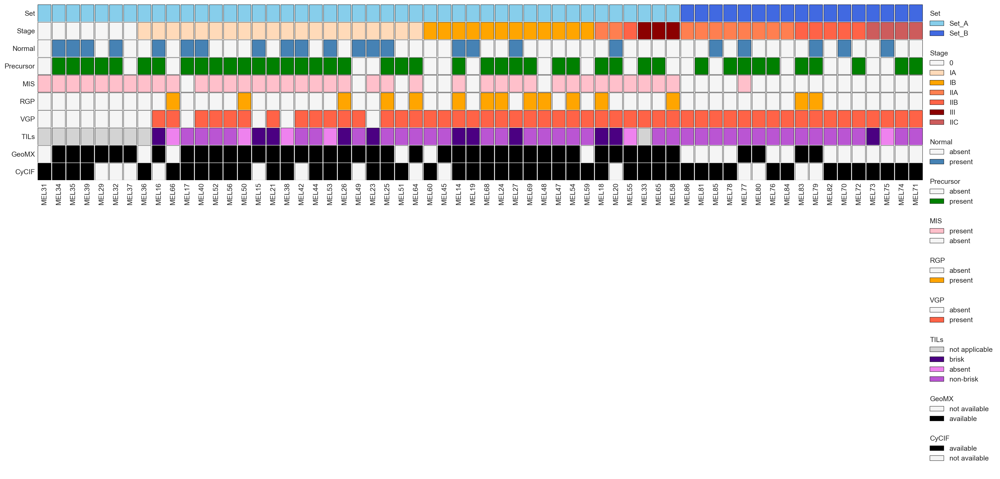

In [21]:
figsize = (10,6) # the size of the figure - changes the shape of the squares in the comut
dpi = 300 # change the output resolution
extension = '.svg' # extension for saving - can otherwise be .pdf, .png, .jpg, etc

plt.rcParams['patch.edgecolor'] = 'black'

plt.rcParams['patch.linewidth'] = 0.5


# You can provide a list of samples to order your comut (from left to right). If none is provided, it will be calculated from your MAF.
samples = None

x_padding = 0.04 # the x distance between patches in comut
y_padding = 0.004 # the y distance between patches in comut
tri_padding = 0.03 # the distance between triangles in comut

# mapping of mutation type to color. Only these mutation types are shown. Can be any valid matplotlib color, e.g. 'blue', #ffa500, or (1,1,1).
vivid_10 = palettable.cartocolors.qualitative.Vivid_10.mpl_colors

PCA_comut = comut.CoMut()
samples = annotation_sorted["Case"].to_list()

# assign the samples
PCA_comut.samples = samples

# color map for continuous values. Could alternatively be a matplotlib colormap eg 'viridis'
purp_7 = palettable.cartocolors.sequential.Purp_7.mpl_colormap
VGP_mapping = {"present": "tomato", "absent": "whitesmoke"}
RGP_mapping = {"present": "orange", "absent": "whitesmoke"}
MIS_mapping = {"present": "pink", "absent": "whitesmoke"}
precusor_mapping = {"present": "green", "absent": "whitesmoke"}
normal_mapping = {"present": "steelblue", "absent": "whitesmoke"}

CyCIF_mapping = {"available": "black", "not available": "whitesmoke"}
GeoMX_mapping = {"available": "black", "not available": "whitesmoke"}
R_mapping = {"present": "orange", "absent": "whitesmoke"}

T_mapping = {"brisk": "indigo", "non-brisk": "mediumorchid",
             "absent": "violet", "not applicable": "lightgrey"}

S_mapping = {"III": "darkred",
             "IIC": "indianred",
             "IIB": "tomato", 
             "IIA": "coral" , 
             "IB": "orange",
             "IA": "peachpuff",
             "0": "whitesmoke"}

A_mapping = {"value": "black"}

Set_mapping = {
    "Set_A": "skyblue",
    "Set_B": "royalblue"
}

PCA_comut.add_categorical_data(CyCIFdata, name="CyCIF", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(GeoMXdata, name="GeoMX", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(Tdata, name="TILs", mapping = T_mapping)

PCA_comut.add_categorical_data(VGPdata, name='VGP', mapping = VGP_mapping)

PCA_comut.add_categorical_data(RGPdata, name='RGP', mapping = RGP_mapping)

PCA_comut.add_categorical_data(MISdata, name='MIS', mapping = MIS_mapping)

PCA_comut.add_categorical_data(Pdata, name='Precursor', mapping = precusor_mapping)

PCA_comut.add_categorical_data(Ndata, name='Normal', mapping = normal_mapping)

PCA_comut.add_categorical_data(Sdata, name="Stage", mapping = S_mapping)

PCA_comut.add_categorical_data(Set_data, name="Set", mapping = Set_mapping)


#PCA_comut.add_bar_data(Bdata, name = 'Breslow(mm)', 
 #                      mapping = A_mapping, 
  #                     #stacked = True, 
   #                    ylabel = 'Breslow(mm)')



# plot CoMut and save
PCA_comut.plot_comut(x_padding = x_padding, y_padding = y_padding, tri_padding = tri_padding, hspace = 0.02, figsize = (25, 5))
PCA_comut.add_unified_legend()
PCA_comut.figure.savefig('PCA_clinical_coMut_05072025' + ".pdf", bbox_inches = 'tight', dpi = dpi)




In [22]:
# organize the data

# VGP
VGPdata = annotation[["Case", "VGP"]].rename(columns = {"Case": "sample", "VGP": "value"})
VGPdata = VGPdata.replace({"Present": "present", "Absent": "absent"})
VGPdata["category"] = "VGP"

# RGP
RGPdata = annotation[["Case", "RGP"]].rename(columns = {"Case": "sample", "RGP": "value"})
RGPdata = RGPdata.replace({"Present": "present", "Absent": "absent"})
RGPdata["category"] = "RGP"
RGPdata.head()

# MIS
MISdata = annotation[["Case", "MIS"]].rename(columns = {"Case": "sample", "MIS": "value"})
MISdata = MISdata.replace({"Present": "present", "Absent": "absent"})
MISdata["category"] = "MIS"
MISdata.head()

# Precusor 
Pdata = annotation[["Case", "Precursor"]].rename(columns = {"Case": "sample", "Precursor": "value"})
Pdata = Pdata.replace({"Present": "present", "Absent": "absent"})
Pdata["category"] = "Precursor"
Pdata.head()


# Normal
Ndata = annotation[["Case", "Normal"]].rename(columns = {"Case": "sample", "Normal": "value"})
Ndata = Ndata.replace({"Present": "present", "Absent": "absent"})
Ndata["category"] = "Normal"
Ndata.head()


# e21
e21data = annotation[["Case", "CyCIF e24 cy13"]]
e21data = e21data.rename(columns = {"Case": "sample", "CyCIF e24 cy13": "value"})
e21data["category"] = "CyCIF_Batch1"
e21data.head()

 # e41
e41data = annotation[["Case", "CyCIF e41"]]
e41data = e41data.rename(columns = {"Case": "sample", "CyCIF e41": "value"})
e41data["category"] = "CyCIF_Batch2"
e41data.head()

# stage2
stage2_data = annotation[["Case", "CyCIF stage II"]]
stage2_data = stage2_data.rename(columns = {"Case": "sample", "CyCIF stage II": "value"})
stage2_data["category"] = "CyCIF stage II"
stage2_data.head()

# GeoMX
GeoMXdata = annotation[["Case", "GeoMx"]]
GeoMXdata = GeoMXdata.rename(columns = {"Case": "sample", "GeoMx": "value"})
GeoMXdata["category"] = "GeoMX"
GeoMXdata.head()

# TILS
Tdata = annotation[["Case", "TILs"]].rename(columns = {"Case": "sample", "TILs": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
Tdata["value"] = Tdata["value"].replace("non brisk", "non-brisk")
Tdata["category"] = "TILs"
Tdata.head()

# Additional Data
Sdata = annotation[["Case", "Stage"]].rename(columns = {"Case": "sample", "Stage": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
Sdata["category"] = "Stage"
Sdata.head()

# Age Data
Bdata = annotation[["Case", "Breslow (mm)"]].rename(columns = {"Case": "sample", "Breslow (mm)": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
#Sdata["category"] = "Sta"
Bdata.head()


,sample,value
0,MEL31,0.0
1,MEL15,0.7
2,MEL16,0.5
3,MEL17,0.6
4,MEL34,0.0


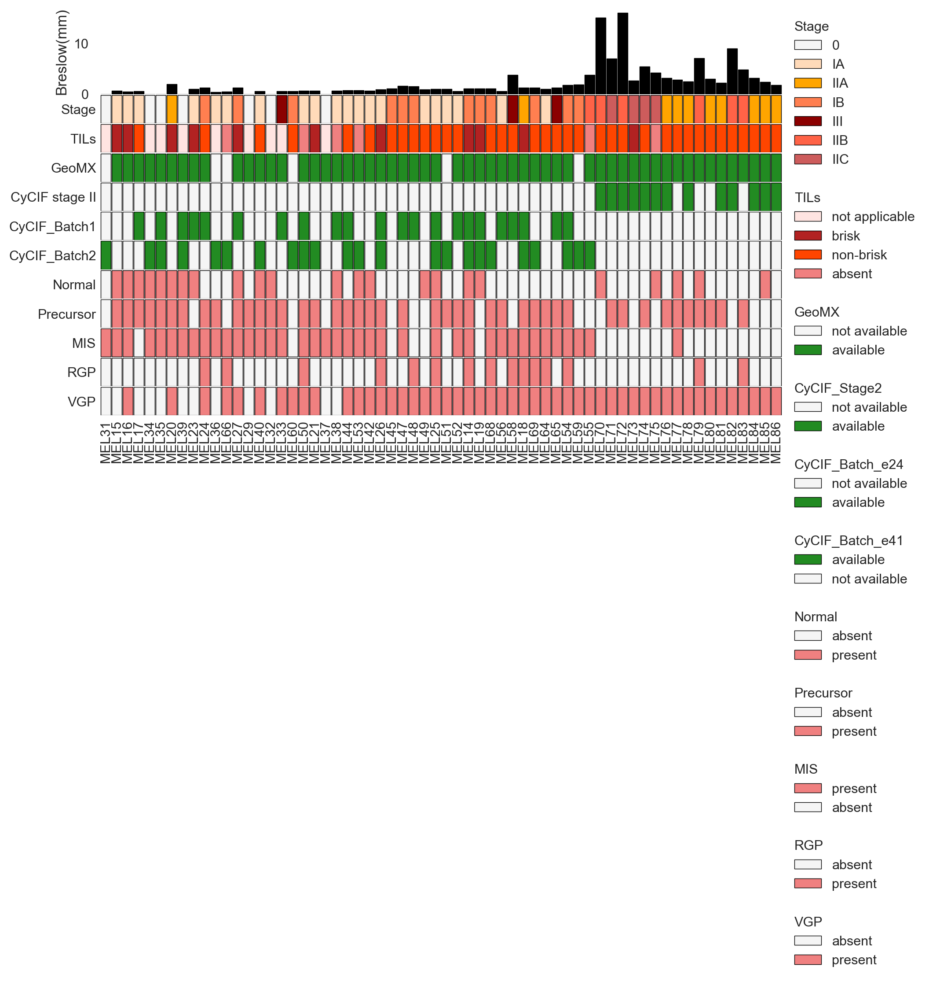

In [23]:
figsize = (10,6) # the size of the figure - changes the shape of the squares in the comut
dpi = 300 # change the output resolution
extension = '.svg' # extension for saving - can otherwise be .pdf, .png, .jpg, etc

# You can provide a list of samples to order your comut (from left to right). If none is provided, it will be calculated from your MAF.
samples = None

x_padding = 0.04 # the x distance between patches in comut
y_padding = 0.004 # the y distance between patches in comut
tri_padding = 0.03 # the distance between triangles in comut

# mapping of mutation type to color. Only these mutation types are shown. Can be any valid matplotlib color, e.g. 'blue', #ffa500, or (1,1,1).
vivid_10 = palettable.cartocolors.qualitative.Vivid_10.mpl_colors

PCA_comut = comut.CoMut()
samples = annotation["Case"].to_list()

# assign the samples
PCA_comut.samples = samples

# color map for continuous values. Could alternatively be a matplotlib colormap eg 'viridis'
purp_7 = palettable.cartocolors.sequential.Purp_7.mpl_colormap
VGP_mapping = {"present": "lightcoral", "absent": "whitesmoke"}
CyCIF_mapping = {"available": "forestgreen", "not available": "whitesmoke"}
GeoMX_mapping = {"available": "skyblue", "not available": "whitesmoke"}
R_mapping = {"present": "orange", "absent": "whitesmoke"}
T_mapping = {"brisk": "firebrick", "non-brisk": "orangered",
             "absent": "lightcoral", "not applicable": "mistyrose"}

S_mapping = {"III": "darkred",
             "IIC": "indianred",
             "IIB": "tomato", 
             "IIA": "orange" , 
             "IB": "coral",
             "IA": "peachpuff",
             "0": "whitesmoke"}

A_mapping = {"value": "black"}

PCA_comut.add_categorical_data(VGPdata, name='VGP', mapping = VGP_mapping)

PCA_comut.add_categorical_data(RGPdata, name='RGP', mapping = VGP_mapping)

PCA_comut.add_categorical_data(MISdata, name='MIS', mapping = VGP_mapping)

PCA_comut.add_categorical_data(Pdata, name='Precursor', mapping = VGP_mapping)

PCA_comut.add_categorical_data(Ndata, name='Normal', mapping = VGP_mapping)

PCA_comut.add_categorical_data(e41data, name="CyCIF_Batch_e41", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(e21data, name="CyCIF_Batch_e24", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(stage2_data, name="CyCIF_Stage2", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(GeoMXdata, name="GeoMX", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(Tdata, name="TILs", mapping = T_mapping)

PCA_comut.add_categorical_data(Sdata, name="Stage", mapping = S_mapping)

PCA_comut.add_bar_data(Bdata, name = 'Breslow(mm)', 
                       mapping = A_mapping, 
                       #stacked = True, 
                       ylabel = 'Breslow(mm)')



# plot CoMut and save
PCA_comut.plot_comut(x_padding = x_padding, y_padding = y_padding, tri_padding = tri_padding, hspace = 0.02, figsize = (10, 6))
PCA_comut.add_unified_legend()
PCA_comut.figure.savefig('PCA_clinical_coMut_09062024' + ".pdf", bbox_inches = 'tight', dpi = dpi)


In [3]:
entropy_pheno = pd.read_csv("merged_entropy.csv", sep = ",")

# columns case, histopathology, and H_spatial 

In [4]:
df = entropy_pheno.copy()
case_order = [
    "MEL58", "MEL19", "MEL18", "MEL48", "MEL54", "MEL24",
    "MEL23", "MEL26", "MEL14", "MEL65", "MEL56", "MEL44",
    "MEL47", "MEL52", "MEL25", "MEL39", "MEL17"]

df["case"] = pd.Categorical(df["case"], categories = case_order, ordered = True)

df_sorted = df.sort_values(by = ["case", "H_spatial"], ascending = [True, True])

df_sorted[["case", "histopathology", "H_spatial"]]

,case,histopathology,H_spatial
77,MEL58,VGP,0.084285
75,MEL58,VGP,0.108385
73,MEL58,VGP,0.126479
69,MEL58,VGP,0.143553
79,MEL58,MIS,0.152464
...,...,...,...
190,MEL39,MIS,0.449824
165,MEL17,VGP,0.277395
163,MEL17,VGP,0.887135
162,MEL17,VGP,1.433569


In [5]:
hist_data = df_sorted[["slide_roi", "histopathology"]]
hist_data = hist_data.rename(columns = {"slide_roi": "sample", "histopathology": "value"})
hist_data["category"] = "histopathology"

entropy_data = df_sorted[["slide_roi", "H_spatial"]].rename(columns = {"slide_roi": "sample", "H_spatial": "value"})
entropy_data["category"] = "entropy_score"

case_data = df_sorted[["slide_roi", "case"]]
case_data = case_data.rename(columns = {"slide_roi": "sample", "case": "value"})
case_data["category"] = "case"

In [6]:
figsize = (10,6) # the size of the figure - changes the shape of the squares in the comut
dpi = 300 # change the output resolution
extension = '.svg' # extension for saving - can otherwise be .pdf, .png, .jpg, etc

plt.rcParams['patch.edgecolor'] = 'grey'

plt.rcParams['patch.linewidth'] = 0.5

# You can provide a list of samples to order your comut (from left to right). If none is provided, it will be calculated from your MAF.

x_padding = 0.04 # the x distance between patches in comut
y_padding = 0.004 # the y distance between patches in comut
tri_padding = 0.03 # the distance between triangles in comut
# mapping of mutation type to color. Only these mutation types are shown. Can be any valid matplotlib color, e.g. 'blue', #ffa500, or (1,1,1).
vivid_10 = palettable.cartocolors.qualitative.Vivid_10.mpl_colors

entropy_comut = comut.CoMut()
samples = df_sorted["slide_roi"].to_list()

entropy_comut.samples = samples
purp_7 = palettable.cartocolors.sequential.Purp_7.mpl_colormap
hist_mapping = {"N": "skyblue",
                "P": "green",
                "MIS": "purple",
                "RGP": "orange",
                "VGP": "red"}

# Define the color dictionary in Python
# Updated color dictionary with valid Python colors
distinct_mel_colors = {
    "MEL58": "tomato",
    "MEL19": "brown",
    "MEL18": "#FFC0CB",   # Light Pink (more distinct than mistyrose2)
    "MEL48": "darkcyan",
    "MEL54": "purple",    # More distinct than plum
    "MEL24": "steelblue",
    "MEL23": "limegreen", # More distinct than palegreen
    "MEL26": "orange",
    "MEL14": "white",     # Replaced white for better visibility
    "MEL65": "springgreen",       # More distinct than coral
    "MEL56": "yellow",    # More visible than lemon chiffon
    "MEL44": "bisque",
    "MEL47": "hotpink",
    "MEL25": "darkgoldenrod", # More distinct than tan
    "MEL52": "skyblue",   # Replaced azure for better contrast
    "MEL39": "thistle",   # Similar to lightpink3 but more visible
    "MEL17":  "darkgrey"}

# Filter the color dictionary based on case_order
filtered_mel_colors = {case: distinct_mel_colors[case] for case in case_order if case in distinct_mel_colors}
entropy_map = {"value": "black"}
entropy_comut.add_categorical_data(case_data, name='case', mapping = filtered_mel_colors)

entropy_comut.add_categorical_data(hist_data, name = "histopathology", mapping = hist_mapping)

entropy_comut.add_bar_data(entropy_data, 
                           name = "entropy_score", 
                           mapping = entropy_map,
                           ylabel = "entropy_score")


entropy_comut.plot_comut(x_padding = x_padding, y_padding = y_padding, tri_padding = tri_padding, 
                         hspace = 0.02, figsize = (40, 4))
entropy_comut.add_unified_legend()

#entropy_comut.axes['case'].set_xticklabels([])

entropy_comut.figure.savefig('entropy_coMut_12102024' + ".pdf", bbox_inches = 'tight', dpi = dpi)



NameError: name 'palettable' is not defined

In [32]:
case_hist_long = (
    df_sorted
    .assign(histopathology=df_sorted["histopathology"].fillna("Not available"))
    .groupby(["case", "histopathology"])
    .size()
    .reset_index(name="n_rois")
    .sort_values(["case", "histopathology"])
)

case_hist_long.to_csv("case_histopathology_long.csv", index=False)

/var/folders/t6/2_c4ymrj7b7b5fqx7h2mz8j00000gp/T/ipykernel_30713/4189877421.py:4: FutureWarning:

The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.



In [26]:
os.getcwd()

'/Users/yshi797/Desktop/PCA'

In [67]:
filtered_mel_colors

{'MEL58': 'tomato',
 'MEL19': 'brown',
 'MEL18': '#FFE4E1',
 'MEL48': 'darkcyan',
 'MEL54': 'plum',
 'MEL24': 'steelblue',
 'MEL23': 'palegreen',
 'MEL26': 'orange',
 'MEL14': '#FFFFFF',
 'MEL65': 'coral',
 'MEL56': '#FFFACD',
 'MEL44': 'bisque',
 'MEL47': 'gold',
 'MEL25': 'tan',
 'MEL52': '#F0FFFF',
 'MEL39': '#D8BFD8',
 'MEL17': 'deeppink'}

In [ ]:



PCA_comut = comut.CoMut()
samples = annotation["Case"].to_list()

# assign the samples
PCA_comut.samples = samples

# color map for continuous values. Could alternatively be a matplotlib colormap eg 'viridis'
purp_7 = palettable.cartocolors.sequential.Purp_7.mpl_colormap
VGP_mapping = {"present": "lightcoral", "absent": "whitesmoke"}
CyCIF_mapping = {"available": "forestgreen", "not available": "whitesmoke"}
GeoMX_mapping = {"available": "skyblue", "not available": "whitesmoke"}
R_mapping = {"present": "orange", "absent": "whitesmoke"}
T_mapping = {"brisk": "firebrick", "non-brisk": "orangered",
             "absent": "lightcoral", "not applicable": "mistyrose"}

S_mapping = {"III": "darkred",
             "IIC": "indianred",
             "IIB": "tomato", 
             "IIA": "orange" , 
             "IB": "coral",
             "IA": "peachpuff",
             "0": "whitesmoke"}

A_mapping = {"value": "black"}

PCA_comut.add_categorical_data(VGPdata, name='VGP', mapping = VGP_mapping)

PCA_comut.add_categorical_data(RGPdata, name='RGP', mapping = VGP_mapping)

PCA_comut.add_categorical_data(MISdata, name='MIS', mapping = VGP_mapping)

PCA_comut.add_categorical_data(Pdata, name='Precursor', mapping = VGP_mapping)

PCA_comut.add_categorical_data(Ndata, name='Normal', mapping = VGP_mapping)

PCA_comut.add_categorical_data(e41data, name="CyCIF_Batch_e41", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(e21data, name="CyCIF_Batch_e24", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(stage2_data, name="CyCIF_Stage2", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(GeoMXdata, name="GeoMX", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(Tdata, name="TILs", mapping = T_mapping)

PCA_comut.add_categorical_data(Sdata, name="Stage", mapping = S_mapping)

PCA_comut.add_bar_data(Bdata, name = 'Breslow(mm)', 
                       mapping = A_mapping, 
                       #stacked = True, 
                       ylabel = 'Breslow(mm)')



# plot CoMut and save
PCA_comut.plot_comut(x_padding = x_padding, y_padding = y_padding, tri_padding = tri_padding, hspace = 0.02, figsize = (10, 6))
PCA_comut.add_unified_legend()
PCA_comut.figure.savefig('PCA_clinical_coMut_09062024' + ".pdf", bbox_inches = 'tight', dpi = dpi)


In [ ]:
# GeoMX
GeoMXdata = annotation[["Case", "GeoMx"]]
GeoMXdata = GeoMXdata.rename(columns = {"Case": "sample", "GeoMx": "value"})
GeoMXdata["category"] = "GeoMX"
GeoMXdata.head()

# TILS
Tdata = annotation[["Case", "TILs"]].rename(columns = {"Case": "sample", "TILs": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
Tdata["value"] = Tdata["value"].replace("non brisk", "non-brisk")
Tdata["category"] = "TILs"
Tdata.head()

# Additional Data
Sdata = annotation[["Case", "Stage"]].rename(columns = {"Case": "sample", "Stage": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
Sdata["category"] = "Stage"
Sdata.head()

# Age Data
Bdata = annotation[["Case", "Breslow (mm)"]].rename(columns = {"Case": "sample", "Breslow (mm)": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
#Sdata["category"] = "Sta"
Bdata.head()


In [17]:



# regression
#GeoMXdata = annotation[["Case", "GeoMx"]]
#Rdata = annotation[["Case", "Regression"]].rename(columns = {"Case": "sample", "Regression": "value"})
#Rdata = Rdata.replace({"Present": "present", "Absent": "absent"})
#Rdata["category"] = "Regression"
#Rdata.head()



# Additional Data
#Gdata = annotation[["Case", "Genomic data"]].rename(columns = {"Case": "sample", "Genomic data": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
#Gdata["category"] = "Genomic data"
#Gdata.head()

# Additional Data
#Sdata = annotation[["Case", "Stage"]].rename(columns = {"Case": "sample", "Stage": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
#Sdata["category"] = "Stage"
#Sdata.head()

# Age Data
#Adata = annotation[["Case", "Age"]].rename(columns = {"Case": "sample", "Age": "value"})
#Tdata = Tdata.replace({"Present": "present", "Absent": "absent"})
#Sdata["category"] = "Sta"
#Adata.head()

#

In [18]:
annotation["Genomic data"].value_counts()

KeyError: 'Genomic data'

In [ ]:
figsize = (10,6) # the size of the figure - changes the shape of the squares in the comut
dpi = 300 # change the output resolution
extension = '.svg' # extension for saving - can otherwise be .pdf, .png, .jpg, etc

# You can provide a list of samples to order your comut (from left to right). If none is provided, it will be calculated from your MAF.
samples = None

x_padding = 0.04 # the x distance between patches in comut
y_padding = 0.004 # the y distance between patches in comut
tri_padding = 0.03 # the distance between triangles in comut

# mapping of mutation type to color. Only these mutation types are shown. Can be any valid matplotlib color, e.g. 'blue', #ffa500, or (1,1,1).
vivid_10 = palettable.cartocolors.qualitative.Vivid_10.mpl_colors

PCA_comut = comut.CoMut()
samples = annotation["Case"].to_list()

# assign the samples
PCA_comut.samples = samples

# color map for continuous values. Could alternatively be a matplotlib colormap eg 'viridis'
purp_7 = palettable.cartocolors.sequential.Purp_7.mpl_colormap
VGP_mapping = {"present": "lightcoral", "absent": "whitesmoke"}
CyCIF_mapping = {"available": "forestgreen", "not available": "whitesmoke"}
GeoMX_mapping = {"available": "skyblue", "not available": "whitesmoke"}
R_mapping = {"present": "orange", "absent": "whitesmoke"}
T_mapping = {"brisk": "firebrick", "non-brisk": "orangered",
             "absent": "lightcoral", "not applicable": "mistyrose"}

G_mapping = {"Immunoprofile": "royalblue", "Oncopanel": "violet",
             "none": "whitesmoke"}

S_mapping = {"III": "darkred",
             "IIC": "indianred",
             "IIB": "tomato", 
             "IIA": "orange" , 
             "IB": "coral",
             "IA": "peachpuff",
             "0": "whitesmoke"}

A_mapping = {"value": "black"}



PCA_comut.add_categorical_data(VGPdata, name='VGP', mapping = VGP_mapping)

PCA_comut.add_categorical_data(RGPdata, name='RGP', mapping = VGP_mapping)

PCA_comut.add_categorical_data(MISdata, name='MIS', mapping = VGP_mapping)

PCA_comut.add_categorical_data(Pdata, name='Precursor', mapping = VGP_mapping)

PCA_comut.add_categorical_data(Ndata, name='Normal', mapping = VGP_mapping)

PCA_comut.add_categorical_data(e41data, name="CyCIF_Batch_e41", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(e21data, name="CyCIF_Batch_e24", mapping = CyCIF_mapping)

PCA_comut.add_categorical_data(GeoMXdata, name="GeoMX", mapping = CyCIF_mapping)

#PCA_comut.add_categorical_data(Gdata, name="Genomic Data", mapping = G_mapping)

#PCA_comut.add_categorical_data(Rdata, name="Regression", mapping = R_mapping)

PCA_comut.add_categorical_data(Tdata, name="TILs", mapping = T_mapping)

PCA_comut.add_categorical_data(Sdata, name="Stage", mapping = S_mapping)

PCA_comut.add_bar_data(Bdata, name = 'age', 
                       mapping = A_mapping, 
                       #stacked = True, 
                       ylabel = 'Age(year)')



# plot CoMut and save
PCA_comut.plot_comut(x_padding = x_padding, y_padding = y_padding, tri_padding = tri_padding, hspace = 0.02, figsize = (10, 6))
PCA_comut.add_unified_legend()
PCA_comut.figure.savefig('PCA_clinical_coMut' + ".pdf", bbox_inches = 'tight', dpi = dpi)



NameError: name 'Adata' is not defined

In [4]:
os.getcwd()

'/Users/yshi797/Desktop/PCA'

In [5]:
e41tumor_adata = ad.read("e41_tumor_12012023.h5ad")

e41tumor_adata

AnnData object with n_obs × n_vars = 168230 × 16
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'ROI', 'ROI_major_category', 'phenotype', 'MEL_id', 'B2Mpos', 'KI67pos', 'optMPIscore', 'prolif', 'MART1pos', 'PMELpos', 'SOX9pos', 'lineage', 'lineage_v2', 'prolif lineage', 'prolif_lineage_v2', 'Ki67pos', 'PCNApos', 'Ki67_PCNApos', 'ECAD_pos', 'invasion', 'MX1pos', 'IRF1pos', 'pSTAT1pos', 'IFN_signaling', 'example', 'BCL2pos', 'ECADpos', 'PRAMEpos', 'pS6pos', 'VIMpos', 'LDHpos', 'S100Bpos', 'pERKpos', 'H3k27me3pos', 'S100A1pos'
    uns: 'all_markers', 'dendrogram_lineage_v2', 'dendrogram_prolif', 'gates', 'imageid_colors', 'spatial_distance'
    obsm: 'umap', 'umap_combat'
    layers: 'combat', 'rescaled'

In [22]:
e41tumor_adata.obs.columns

Index(['X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength',
       'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation',
       'CellID', 'imageid', 'ROI', 'ROI_major_category', 'phenotype', 'MEL_id',
       'B2Mpos', 'KI67pos', 'optMPIscore', 'prolif', 'MART1pos', 'PMELpos',
       'SOX9pos', 'lineage', 'lineage_v2', 'prolif lineage',
       'prolif_lineage_v2', 'Ki67pos', 'PCNApos', 'Ki67_PCNApos', 'ECAD_pos',
       'invasion', 'MX1pos', 'IRF1pos', 'pSTAT1pos', 'IFN_signaling',
       'example', 'BCL2pos', 'ECADpos', 'PRAMEpos', 'pS6pos', 'VIMpos',
       'LDHpos', 'S100Bpos', 'pERKpos', 'H3k27me3pos', 'S100A1pos'],
      dtype='object')

In [23]:
e41tumor_adata.obs[["MEL_id", "phenotype", "lineage", "lineage_v2"]]

,MEL_id,phenotype,lineage,lineage_v2
LSP11314--unmicst_cellRing_32,MEL14,Melanocytes,MART1- PMEL- SOX9-,melanocytic
LSP11314--unmicst_cellRing_125,MEL14,Melanocytes,MART1+ PMEL+ SOX9-,melanocytic
LSP11314--unmicst_cellRing_161,MEL14,Melanocytes,MART1+ PMEL+ SOX9-,melanocytic
LSP11314--unmicst_cellRing_166,MEL14,Melanocytes,MART1- PMEL- SOX9-,melanocytic
LSP11314--unmicst_cellRing_229,MEL14,Melanocytes,MART1- PMEL- SOX9-,melanocytic
...,...,...,...,...
LSP12424--unmicst_cellRing_39742,MEL50,Melanocytes,MART1- PMEL- SOX9-,melanocytic
LSP12424--unmicst_cellRing_39745,MEL50,Melanocytes,MART1- PMEL- SOX9-,melanocytic
LSP12424--unmicst_cellRing_39763,MEL50,Melanocytes,MART1+ PMEL- SOX9-,melanocytic
LSP12424--unmicst_cellRing_39787,MEL50,Melanocytes,MART1+ PMEL- SOX9-,melanocytic


In [24]:
e41tumor_adata.obs.lineage_v2.value_counts()

melanocytic         127503
transitionary        30767
undifferentiated      9960
Name: lineage_v2, dtype: int64

In [28]:

patients = e41tumor_adata.obs.MEL_id.unique().to_list()

len(patients)

24

In [34]:
patients 

['MEL14',
 'MEL16',
 'MEL18',
 'MEL19',
 'MEL25',
 'MEL26',
 'MEL39',
 'MEL40',
 'MEL44',
 'MEL53',
 'MEL60',
 'MEL66',
 'MEL68_B1',
 'MEL69',
 'MEL21',
 'MEL31',
 'MEL34',
 'MEL35',
 'MEL36_A2',
 'MEL51',
 'MEL54',
 'MEL55',
 'MEL59',
 'MEL50']

In [53]:
# define patients based on the T
Tis = ["MEL21", "MEL31","MEL34", "MEL35", "MEL39", "MEL68_B1"]
T1 = ["MEL16", "MEL25", "MEL26", "MEL36_A2","MEL40", "MEL44", "MEL50","MEL51", "MEL53", "MEL66"]
T2 = ["MEL14", "MEL18", "MEL19", "MEL54", "MEL59","MEL60", "MEL69"]
T3 = ["MEL55"]

print(len(Tis), len(T1), len(T2), len(T3))


6 10 7 1


In [73]:
# add column to it
e41lin_percent["Tstage"] = "unknown"
e41lin_percent.loc[e41lin_percent.index.isin(Tis), ["Tstage"]] = "Tis"
e41lin_percent.loc[e41lin_percent.index.isin(T1), ["Tstage"]] = "T1"
e41lin_percent.loc[e41lin_percent.index.isin(T2), ["Tstage"]] = "T2"
e41lin_percent.loc[e41lin_percent.index.isin(T3), ["Tstage"]] = "T3"


tstage_order = ["Tis", "T1", "T2", "T3"]

# sort the dataframe based on Tstage and then by melanocytic value
e41lin_percent["Tstage"] = pd.Categorical(e41lin_percent["Tstage"], categories= tstage_order, ordered = True)

# after set up the categories, then sorted the data

e41lin_percent_sorted = e41lin_percent.sort_values(by = ["Tstage", "melanocytic", "transitionary", "undifferentiated"], ascending = [True, False, False, False])

e41lin_percent_sorted

lineage_v2,melanocytic,transitionary,undifferentiated,Tstage
MEL_id,,,,
MEL39,0.996032,0.003086,0.000882,Tis
MEL21,0.971154,0.020833,0.008013,Tis
MEL34,0.965997,0.026790,0.007213,Tis
MEL68_B1,0.867740,0.076624,0.055635,Tis
MEL31,0.817691,0.164754,0.017556,Tis
MEL35,0.592623,0.391803,0.015574,Tis
MEL36_A2,1.000000,0.000000,0.000000,T1
MEL51,0.908831,0.055192,0.035977,T1
MEL16,0.904464,0.062469,0.033067,T1


In [99]:
Tstages = pd.read_csv("PCA_II_cohort_v5.csv")
e41samples  = Tstages.loc[Tstages["CyCIF e41"] == "available", ["Case", "Tumor", "CyCIF e41", "TILs"]]

len(e41samples)

22

In [101]:
e41brisk = Tstages.loc[Tstages["TILs"] == "brisk", "Case"].to_list()
e41nonbrisk = Tstages.loc[Tstages["TILs"] == "non-brisk", "Case"].to_list()
e41brisk_absent = Tstages.loc[Tstages["TILs"] == "absent", "Case"].to_list()
e41brisk_NA = Tstages.loc[Tstages["TILs"] == "not applicable", "Case"].to_list()




['MEL14',
 'MEL15',
 'MEL16',
 'MEL18',
 'MEL19',
 'MEL20',
 'MEL21',
 'MEL23',
 'MEL26',
 'MEL27']

In [106]:
e41lin_percent["TILs"] = 0
e41lin_percent.loc[e41lin_percent.index.isin(e41brisk), "TILs"] = "brisk"
e41lin_percent.loc[e41lin_percent.index.isin(e41nonbrisk), "TILs"] = "non_brisk"
e41lin_percent.loc[e41lin_percent.index.isin(e41brisk_absent), "TILs"] = "absent"
e41lin_percent.loc[e41lin_percent.index.isin(e41brisk_NA), "TILs"] = "not_applicable"
e41lin_percent.loc[e41lin_percent.index == "MEL36_A2", "TILs"] = "not_applicable"
e41lin_percent.loc[e41lin_percent.index == "MEL68_B1", "TILs"] = "non_brisk"

e41lin_percent["TILs"].value_counts()

non_brisk         9
brisk             6
not_applicable    5
absent            4
Name: TILs, dtype: int64

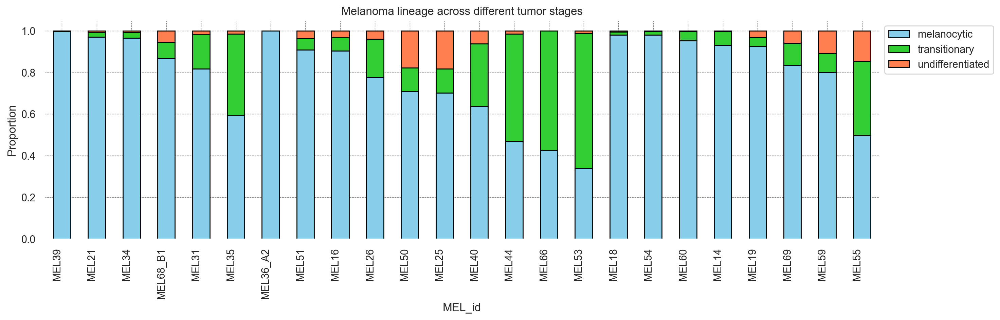

In [171]:
mpl.rcParams.update({'font.size': 16})

fig, ax = plt.subplots(figsize = (15, 5))

e41lin_percent_sorted[["melanocytic", "transitionary", "undifferentiated"]].plot(kind = "bar", stacked = True, ax = ax, color = ["skyblue", "limegreen", "coral"], edgecolor = "black", linewidth = 1)

ax.set_xticklabels(e41lin_percent_sorted.index, 
                   #rotation = 45, 
                   ha = "right")

# Add labels and title
ax.set_xlabel('MEL_id')
ax.set_ylabel('Proportion')
ax.set_title('Melanoma lineage across different tumor stages')

# Set the background color of the axes (plot area) to white
ax.set_facecolor('white')

# Enable the grid
ax.grid(True, color = "grey", linestyle = "--", linewidth = 0.5)

# Set the grid lines to be behind the plot elements
ax.set_axisbelow(True)

# Move the legend
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon = True, facecolor = "white")

plt.tight_layout()

# Save the figure as a PDF
plt.savefig("tumor_lineage_T.pdf", format='pdf')

plt.show()

In [109]:
brisk_order = ["brisk", "non_brisk", "absent", "not_applicable"]

# sort the dataframe based on Tstage and then by melanocytic value
e41lin_percent["TILs"] = pd.Categorical(e41lin_percent["TILs"], categories= brisk_order, ordered = True)

# after set up the categories, then sorted the data

e41lin_percent_brisk_sorted = e41lin_percent.sort_values(by = ["TILs", "melanocytic", "transitionary", "undifferentiated"], ascending = [True, False, False, False])

e41lin_percent_brisk_sorted

lineage_v2,melanocytic,transitionary,undifferentiated,Tstage,TILs
MEL_id,,,,,
MEL18,0.980623,0.014483,0.004894,T2,brisk
MEL21,0.971154,0.020833,0.008013,Tis,brisk
MEL14,0.930613,0.068296,0.001091,T2,brisk
MEL19,0.924184,0.045160,0.030656,T2,brisk
MEL16,0.904464,0.062469,0.033067,T1,brisk
MEL26,0.777288,0.183940,0.038773,T1,brisk
MEL54,0.980619,0.017619,0.001762,T2,non_brisk
MEL60,0.952129,0.045228,0.002643,T2,non_brisk
MEL51,0.908831,0.055192,0.035977,T1,non_brisk


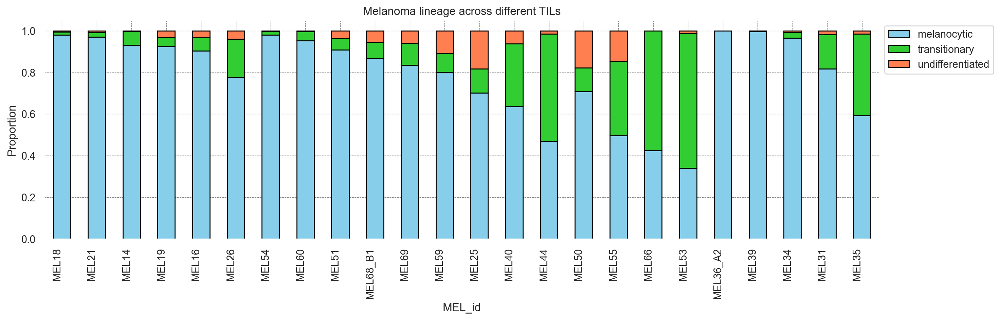

In [172]:
mpl.rcParams.update({'font.size': 16})

fig, ax = plt.subplots(figsize = (15, 5))

e41lin_percent_brisk_sorted[["melanocytic", "transitionary", "undifferentiated"]].plot(kind = "bar", stacked = True, ax = ax, color = ["skyblue", "limegreen", "coral"], edgecolor = "black", linewidth = 1)

ax.set_xticklabels(e41lin_percent_brisk_sorted.index, 
                   #rotation = 45, 
                   ha = "right")

# Add labels and title
ax.set_xlabel('MEL_id')
ax.set_ylabel('Proportion')
ax.set_title('Melanoma lineage across different TILs')

# Set the background color of the axes (plot area) to white
ax.set_facecolor('white')

# Enable the grid
ax.grid(True, color = "grey", linestyle = "--", linewidth = 0.5)

# Set the grid lines to be behind the plot elements
ax.set_axisbelow(True)

# Move the legend
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon = True, facecolor = "white")

plt.tight_layout()

# Save the figure as a PDF
plt.savefig("tumor_lineage_TILs.pdf", format='pdf')

plt.show()

In [159]:
# now check the data based on sun damage
sun_damage = pd.read_csv("PCA_sun_damage_anno.csv")
sun_damage

,ID,MEL ID,location,Unnamed: 3,solar elastosis,Unnamed: 5
0,LSP11315,MEL14,right lower back,lower back,0.0,NaN
1,LSP11331,MEL16,right upper neck,neck,2.0,NaN
2,LSP11339,MEL17,right lateral thigh,thigh,0.0,NaN
3,LSP11347,MEL18,left neck,neck,1.0,NaN
4,LSP11355,MEL19,left poteromedial upper arm,arm,1.0,NaN
5,LSP11387,MEL23,left lateral abdomen,abdomen,0.0,NaN
6,LSP11395,MEL24,right upper arm,arm,2.0,NaN
7,LSP11403,MEL25,left upper dorsal arm,arm,2.0,NaN
8,LSP11411,MEL26,right anterior thigh,thigh,1.5,NaN
9,LSP11419,MEL27,left flank,flank,1.0,NaN


In [160]:
sun_damage["solar elastosis"].value_counts()

1.0    13
0.0     9
0.5     8
2.0     7
1.5     4
Name: solar elastosis, dtype: int64

In [163]:
zero = sun_damage.loc[sun_damage["solar elastosis"] == 0, "MEL ID"].tolist()
half = sun_damage.loc[sun_damage["solar elastosis"] == 0.5, "MEL ID"].tolist()
one = sun_damage.loc[sun_damage["solar elastosis"] == 1, "MEL ID"].tolist()
one_half = sun_damage.loc[sun_damage["solar elastosis"] == 1.5, "MEL ID"].tolist()
two = sun_damage.loc[sun_damage["solar elastosis"] == 2, "MEL ID"].tolist()

In [167]:
e41lin_percent["SunDamage"] = "unknown"
e41lin_percent.loc[e41lin_percent.index.isin(zero), "SunDamage"] = 0
e41lin_percent.loc[e41lin_percent.index.isin(half), "SunDamage"] = 0.5
e41lin_percent.loc[e41lin_percent.index.isin(one), "SunDamage"] = 1
e41lin_percent.loc[e41lin_percent.index.isin(one_half), "SunDamage"] = 1.5
e41lin_percent.loc[e41lin_percent.index.isin(two), "SunDamage"] = 2

e41lin_percent["SunDamage"].value_counts()

1          7
0          5
0.5        5
2          4
1.5        2
unknown    1
Name: SunDamage, dtype: int64

In [169]:
sun_damage_order = [0, 0.5, 1, 1.5, 2, "unknown"]

# sort the dataframe based on Tstage and then by melanocytic value
e41lin_percent["SunDamage"] = pd.Categorical(e41lin_percent["SunDamage"], categories= sun_damage_order, ordered = True)

# after set up the categories, then sorted the data

e41lin_percent_SD_sorted = e41lin_percent.sort_values(by = ["SunDamage", "melanocytic", "transitionary", "undifferentiated"], ascending = [True, False, False, False])

e41lin_percent_SD_sorted

lineage_v2,melanocytic,transitionary,undifferentiated,Tstage,TILs,SunDamage
MEL_id,,,,,,
MEL14,0.930613,0.068296,0.001091,T2,brisk,0
MEL69,0.835791,0.105325,0.058883,T2,non_brisk,0
MEL31,0.817691,0.164754,0.017556,Tis,not_applicable,0
MEL50,0.707497,0.115112,0.177391,T1,absent,0
MEL53,0.339918,0.648755,0.011327,T1,absent,0
MEL39,0.996032,0.003086,0.000882,Tis,not_applicable,0.5
MEL54,0.980619,0.017619,0.001762,T2,non_brisk,0.5
MEL21,0.971154,0.020833,0.008013,Tis,brisk,0.5
MEL40,0.637068,0.300084,0.062848,T1,non_brisk,0.5


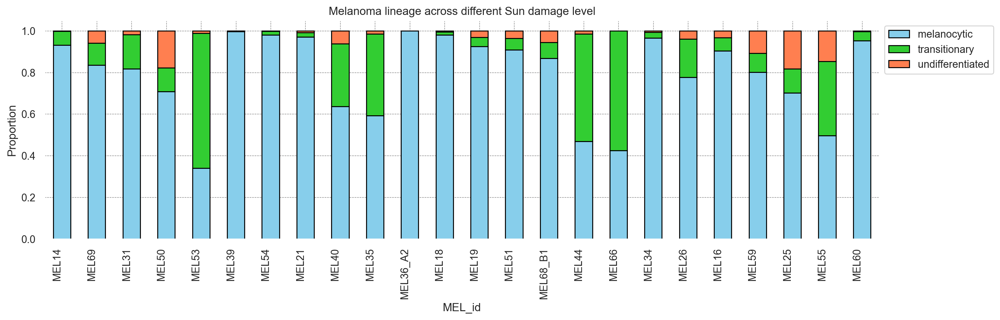

In [173]:
mpl.rcParams.update({'font.size': 16})

fig, ax = plt.subplots(figsize = (15, 5))

e41lin_percent_SD_sorted[["melanocytic", "transitionary", "undifferentiated"]].plot(kind = "bar", stacked = True, ax = ax, color = ["skyblue", "limegreen", "coral"], edgecolor = "black", linewidth = 1)

ax.set_xticklabels(e41lin_percent_SD_sorted.index, 
                   #rotation = 45, 
                   ha = "right")

# Add labels and title
ax.set_xlabel('MEL_id')
ax.set_ylabel('Proportion')
ax.set_title('Melanoma lineage across different Sun damage level')

# Set the background color of the axes (plot area) to white
ax.set_facecolor('white')

# Enable the grid
ax.grid(True, color = "grey", linestyle = "--", linewidth = 0.5)

# Set the grid lines to be behind the plot elements
ax.set_axisbelow(True)

# Move the legend
ax.legend(loc='upper left', bbox_to_anchor=(1,1), frameon = True, facecolor = "white")

plt.tight_layout()

# Save the figure as a PDF
plt.savefig("tumor_lineage_SD.pdf", format='pdf')

plt.show()

In [122]:
# now check the Mel27 expression
MEL27adata = ad.read("e41_MEL27.h5ad")
GeoMX_ROIs = MEL27adata.obs.ROI_GeoMX.unique().tolist()
len(GeoMX_ROIs)

24

In [139]:
GeoMX_ROIs

['Other',
 'LSP13918_023',
 'LSP13918_024',
 'LSP13918_015',
 'LSP13918_018',
 'LSP13914_006',
 'LSP13918_014',
 'LSP13918_022',
 'LSP13918_020',
 'LSP13918_017',
 'LSP13918_019',
 'LSP13914_007',
 'LSP13918_021',
 'LSP13918_025',
 'LSP13918_016',
 'LSP13918_013',
 'LSP13918_012',
 'LSP13918_011',
 'LSP13918_007',
 'LSP13918_010',
 'LSP13918_009',
 'LSP13918_006',
 'LSP13918_008',
 'LSP13918_005']

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


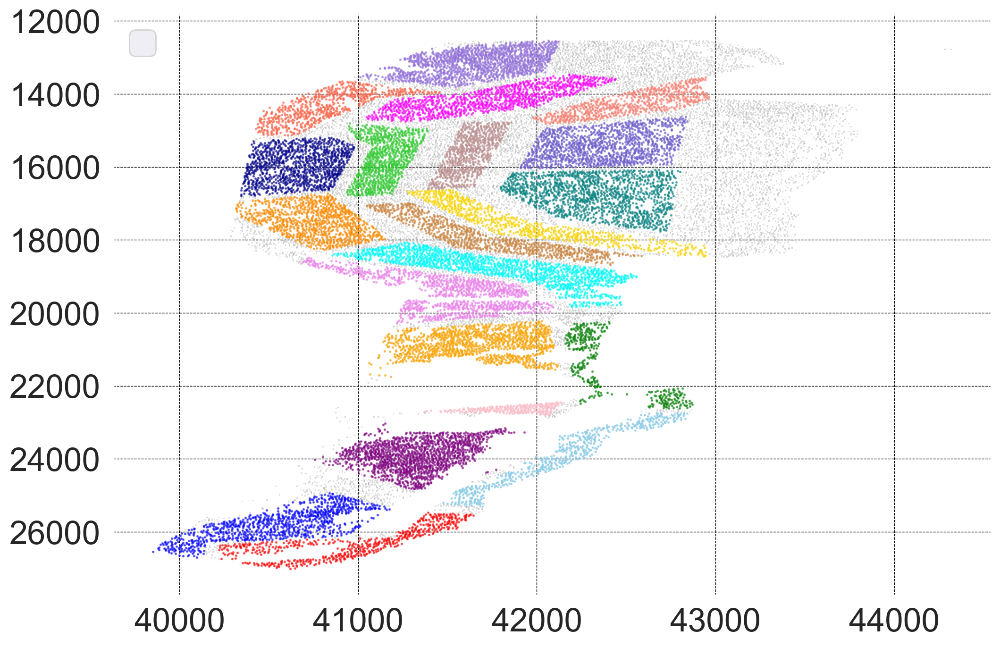

In [141]:
# check the ROIs spatially
fig = plt.figure(figsize = (12, 8), facecolor = "white")
#fig.patch.set_facecolor('white')
ax = fig.add_subplot(111, facecolor = "white")
# # all points
ax.scatter(*zip(*MEL27adata.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=0.01, color="grey", alpha=1)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_005", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="red", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_006", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="skyblue", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_007", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="green", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_008", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="blue", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_009", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="purple", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_010", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="pink", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_011", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="orange", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_012", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="violet", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_013", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="peru", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_014", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="limegreen", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_015", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="magenta", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_016", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="gold", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_017", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="rosybrown", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_018", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="salmon", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_019", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="teal", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_020", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="slateblue", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_021", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="darkorange", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_022", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="darkblue", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_023", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="tomato", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_024", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="mediumpurple", alpha=0.5)

tmp = MEL27adata[MEL27adata.obs["ROI_GeoMX"] == "LSP13918_025", ]
ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), s=1, color="cyan", alpha=0.5)

ax.grid(color='black', linestyle='--', linewidth=0.5)

ax.tick_params(axis='x', labelsize=25)  # Change 12 to your desired font size
ax.tick_params(axis='y', labelsize=25)
# set legend
ax.legend(fontsize=25)
ax.invert_yaxis()
plt.show()

In [150]:
MEL27adata.X

array([[0.6997112 , 0.84988326, 0.7394071 , ..., 0.56517696, 0.52041644,
        0.6175082 ],
       [0.66843975, 0.8001327 , 0.7529786 , ..., 0.56547356, 0.5202623 ,
        0.6069131 ],
       [0.75755954, 0.8166942 , 0.72437865, ..., 0.5637317 , 0.5197579 ,
        0.6215656 ],
       ...,
       [0.6760063 , 0.7846891 , 0.6994822 , ..., 0.6011958 , 0.5175727 ,
        0.58507943],
       [0.75594306, 0.80719954, 0.72234493, ..., 0.60101604, 0.5195794 ,
        0.59648776],
       [0.7087326 , 0.78172785, 0.7006235 , ..., 0.60397434, 0.5202278 ,
        0.58083344]], dtype=float32)

In [154]:
MEL27adata.obs.columns

Index(['X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength',
       'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation',
       'CellID', 'imageid', 'ROI', 'LOSE', 'phenotype', 'ROI_GeoMX'],
      dtype='object')

In [181]:
MEL27adata.obs.phenotype.value_counts()

Unknown            14022
Myeloid lineage     9390
Melanocytes         4586
Keratinocytes       1400
Myofibroblasts       764
Name: phenotype, dtype: int64

In [229]:
MEL27tumor = MEL27adata[MEL27adata.obs["phenotype"] == "Melanocytes", ]
MEL27tumor

View of AnnData object with n_obs × n_vars = 4586 × 38
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'ROI', 'LOSE', 'phenotype', 'ROI_GeoMX'
    uns: 'all_markers', 'gates'

In [230]:
MEL27adata.var_names

Index(['DNA1', '5hmC', 'Tet2', 'SOX10', 'LaminA/C/B1', 'PMEL', 'SOX9', 'S100B',
       'MART1', 'aSMA', 'MITF', 'p21', 'panCK', 'ECAD', 'pSTAT1', 'MCM2',
       'S100A1', 'Ki67', 'pSTAT3', 'PD1', 'pH3', 'PRAME', 'IRF5', 'IRF1',
       'B2M', 'MX1', 'CD11c', 'NGFR', 'CK14', 'LDH', 'pERK', 'BCL2', 'VIM',
       'CD3e', 'pS6', 'CCND1', 'CCNA2', 'PCNA'],
      dtype='object')

In [233]:
MEL27tumor_expr = pd.DataFrame(MEL27tumor.X, 
                               index = MEL27tumor.obs_names, 
                               columns = MEL27tumor.var_names)[["SOX10", "PMEL", "MART1", "MITF", "SOX9","NGFR", "ECAD"]]

MEL27tumor_expr["GeoMX_ROIs"] = MEL27tumor.obs["ROI_GeoMX"]

MEL27tumor_expr.GeoMX_ROIs.value_counts()


Other           781
LSP13918_009    731
LSP13918_011    661
LSP13914_006    413
LSP13914_007    379
LSP13918_019    328
LSP13918_005    178
LSP13918_012    177
LSP13918_016    166
LSP13918_006    164
LSP13918_020    130
LSP13918_010    101
LSP13918_013     85
LSP13918_015     61
LSP13918_018     49
LSP13918_008     44
LSP13918_007     37
LSP13918_021     30
LSP13918_022     28
LSP13918_017     19
LSP13918_025     15
LSP13918_014      9
Name: GeoMX_ROIs, dtype: int64

In [ ]:
len(MEL27tumor_expr.GeoMX)

In [234]:
MEL27tumor_expr_mean = MEL27tumor_expr.groupby("GeoMX_ROIs").mean()
MEL27tumor_expr_mean.to_csv("MEL27tumor_expr_mean.csv")

In [235]:
corr = MEL27tumor_expr_mean.corr()

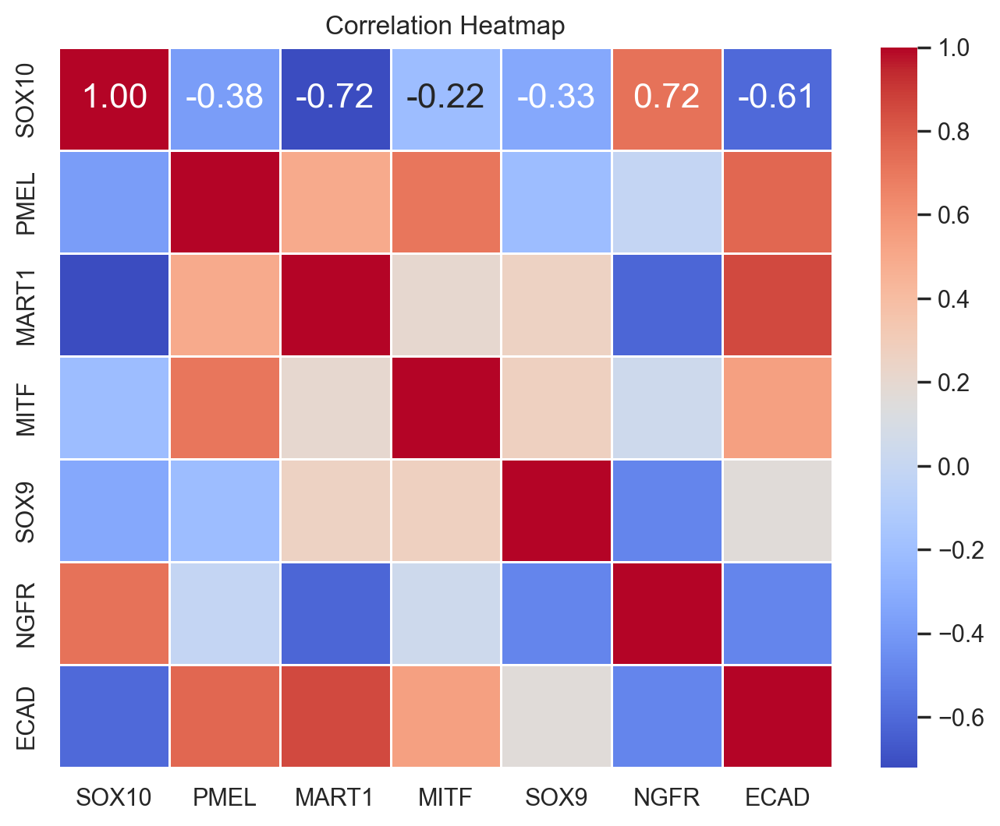

In [236]:
# Generate a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(corr, annot=True, cmap='coolwarm', linewidths=.5, fmt=".2f")
plt.title("Correlation Heatmap")
plt.show()

# Figure 3E 

In [186]:
# Recreate the dataframe
data = pd.DataFrame({
    'Category': ['undifferentiated', 'transitionary', 'melanocytic'],
    'tumor_enriched_perc': [20.02946, 81.87707, 72.88532],
    'other_neighborhoods_perc': [79.97054, 18.12293, 27.11468]
})
data

,Category,tumor_enriched_perc,other_neighborhoods_perc
0,undifferentiated,20.02946,79.97054
1,transitionary,81.87707,18.12293
2,melanocytic,72.88532,27.11468


In [212]:
# New dataframe with the provided raw counts
from scipy.stats import chi2_contingency

data_raw = pd.DataFrame({
    'Category': ['undifferentiated', 'transitionary', 'melanocytic'],
    'tumor_enriched': [136, 29705, 180276],
    'other_neighborhoods': [543, 6575, 67066]
})

# Create a contingency table from the raw counts for statistical testing
contingency_table_raw = data_raw[['tumor_enriched', 'other_neighborhoods']].values

# Perform the Chi-squared test on the raw counts
chi2_raw, p_raw, dof_raw, expected_raw = chi2_contingency(contingency_table_raw)

chi2_raw, p_raw, dof_raw, expected_raw

(2350.95050658086,
 0.0,
 2,
 array([[5.01825329e+02, 1.77174671e+02],
        [2.68132886e+04, 9.46671141e+03],
        [1.82801886e+05, 6.45401139e+04]]))

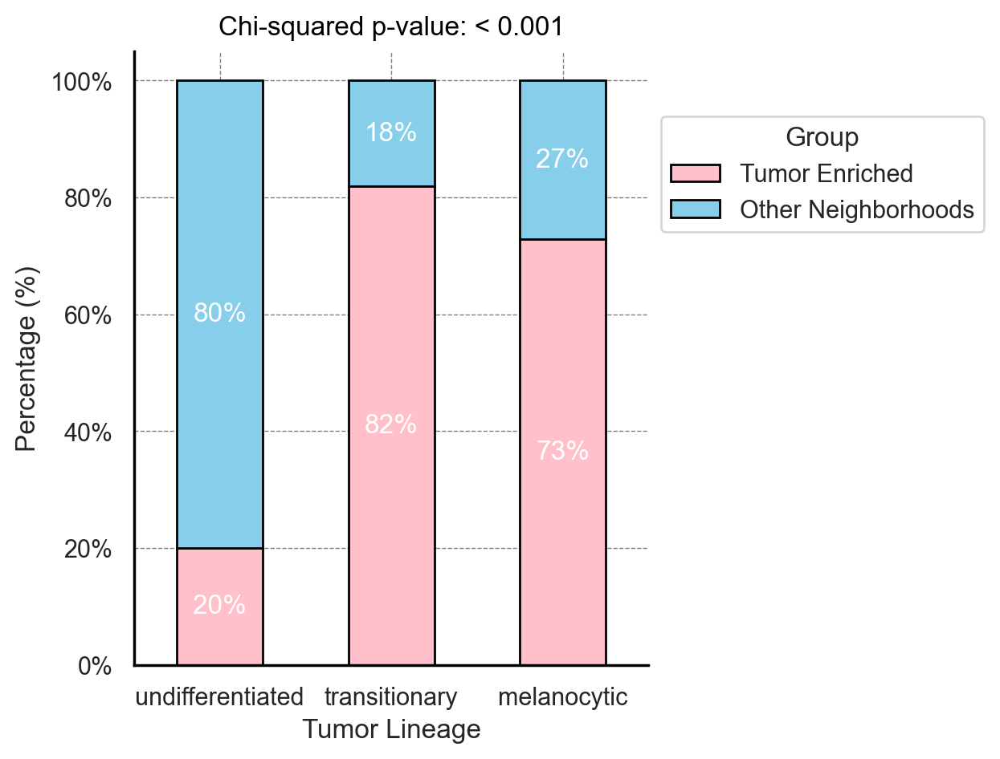

In [228]:
mpl.rcParams.update({'font.size': 16})

# Plot stacked bar chart with percentage values inside each bar and black edges

fig, ax = plt.subplots(figsize=(6.5, 5))
bars = data.set_index('Category').div(data.set_index('Category').sum(axis=1), axis=0).plot(kind='bar', stacked=True, color=['pink', "skyblue"], edgecolor='black', ax=ax)

# Adding percentage values on each bar
for bar in bars.patches:
    # The bar is a Rectangle instance
    bar_height = bar.get_height()
    if bar_height > 0:  # To avoid placing text for zero height bars
        ax.text(bar.get_x() + bar.get_width() / 2, 
                bar.get_y() + bar_height / 2,
                f"{bar_height:.0%}", 
                ha='center', 
                va='center', 
                color='white', 
                fontsize=12)

#plt.title('% of Tumor Enriched and Other Neighborhoods')
plt.xlabel('Tumor Lineage')
plt.ylabel('Percentage (%)')
plt.legend(title='Group', 
           labels=['Tumor Enriched', 'Other Neighborhoods'], 
           loc='center left', bbox_to_anchor=(1, 0.8),
           facecolor = "white")
plt.xticks(rotation=0)

# Set spines (axes lines) visibility
ax.spines['bottom'].set_visible(True)
ax.spines['bottom'].set_color('black')
ax.spines['left'].set_visible(True)
ax.spines['left'].set_color('black')

# Remove the right and top spines
ax.spines['right'].set_visible(False)
ax.spines['top'].set_visible(False)

ax.set_facecolor('white')
ax.yaxis.set_major_formatter(plt.FuncFormatter('{:.0%}'.format))
ax.grid(True, color = "grey", linestyle = "--", linewidth = 0.5)

p_value_annotation = "Chi-squared p-value: < 0.001" if p_raw < 0.001 else f"Chi-squared p-value: {p_raw:.4f}"

ax.annotate(p_value_annotation, xy=(0.5, 1), xycoords='axes fraction', xytext=(0, 5), textcoords='offset points',
            ha='center', va='bottom', fontsize=12, color='black', bbox=dict(facecolor='none', 
                                                                            #edgecolor='black', 
                                                                            #boxstyle='round,pad=0.5')
                                                                            ))
#ax.set_ylim(1.1)
plt.tight_layout()

# Save the figure as a PDF
plt.savefig("tumor_lineage_neighborhood_analysis.pdf", format='pdf')

plt.show()

# Show cells expression

In [6]:
os.chdir("/Users/yshi797/Desktop/PCA")

e41tumor_adata = ad.read("e41_tumor_10072023.h5ad")
# 
e41tumor_adata

AnnData object with n_obs × n_vars = 168230 × 42
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'ROI', 'ROI_major_category', 'phenotype', 'MEL_id', 'B2Mpos', 'KI67pos', 'optMPIscore', 'prolif', 'MART1pos', 'PMELpos', 'SOX9pos', 'lineage', 'lineage_v2', 'prolif lineage', 'prolif_lineage_v2', 'Ki67pos', 'PCNApos', 'Ki67_PCNApos', 'ECAD_pos', 'invasion', 'MX1pos', 'IRF1pos', 'pSTAT1pos', 'IFN_signaling', 'example'
    uns: 'all_markers', 'dendrogram_lineage_v2', 'dendrogram_prolif', 'gates', 'imageid_colors', 'spatial_distance'
    obsm: 'umap', 'umap_combat'
    layers: 'combat', 'rescaled'

In [7]:
# converting the expression file
expressionDF = pd.DataFrame(e41tumor_adata.X, index = e41tumor_adata.obs_names, columns = e41tumor_adata.var_names)
tumor_expressionDF = expressionDF[["SOX10", "SOX9", "NGFR", "MART1", "MITF"]]
phenotype = pd.DataFrame(e41tumor_adata.obs)[["ROI_major_category", "MEL_id", "lineage_v2"]]

In [18]:
#!pip install PyComplexHeatmap
import os,sys
%matplotlib inline
import matplotlib.pylab as plt
import pickle
plt.rcParams['figure.dpi'] = 100
plt.rcParams['savefig.dpi']=300
plt.rcParams['font.family']='sans serif'
plt.rcParams['font.sans-serif']='Arial'
plt.rcParams['pdf.fonttype']=42
# sys.path.append(os.path.expanduser("~/Projects/Github/PyComplexHeatmap/"))
import PyComplexHeatmap as pch
print(pch.__version__)

ModuleNotFoundError: No module named 'PyComplexHeatmap'

In [ ]:
cm = pch.ClusterMapPlotter(data = tumor_expressionDF)

plt.show()

Starting plotting..
Starting calculating row orders..
Reordering rows..


/Users/yshi797/opt/anaconda3/envs/spatialcells/lib/python3.10/site-packages/PyComplexHeatmap/clustermap.py:836: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



: 

In [8]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

g = sns.clustermap(tumor_expressionDF, 
                   figsize=(10, 10), # You can change the size to fit your data
                   row_cluster=True, # Change to False if you don't want to cluster rows
                   col_cluster=True, # Change to False if you don't want to cluster column
                   #row_colors=anno_df, # Add the annotation DataFrame here
                   cmap='viridis', # Use any colormap you like
                   yticklabels=False) # Turn off y-axis labels if they are too crowded


/Users/yshi797/opt/anaconda3/envs/spatialcells/lib/python3.10/site-packages/seaborn/matrix.py:654: UserWarning:

Clustering large matrix with scipy. Installing `fastcluster` may give better performance.



In [ ]:
tumor_expressionDF.to_csv("e41tumor_expression_01252024.csv", index = True)
phenotype.to_csv("e41tumor_pheno_01252024.csv")

# Spatialcell analysis using e41

In [4]:
# load the proper data
e41tumor_adata = ad.read("e41_tumor_12012023.h5ad")
e41all_adata = ad.read("e41_all_cells_v4.h5ad")

In [5]:
e41tumor_adata.obs.lineage_v2.value_counts()

melanocytic         127503
transitionary        30767
undifferentiated      9960
Name: lineage_v2, dtype: int64

In [6]:
# identify tumor phenotype
melanocytic = e41tumor_adata.obs[e41tumor_adata.obs["lineage_v2"] == "melanocytic"].index
transitionary = e41tumor_adata.obs[e41tumor_adata.obs["lineage_v2"] == "transitionary"].index
undifferentiated = e41tumor_adata.obs[e41tumor_adata.obs["lineage_v2"] == "undifferentiated"].index

print(len(melanocytic), len(transitionary), len(undifferentiated))

127503 30767 9960


In [7]:
# now annotated the all cell data
e41_tumorcells = e41tumor_adata.obs.index
e41_tumorcells

# set a new column in all adata samples
e41all_adata.obs["tumor"] = False
e41all_adata.obs.loc[e41_tumorcells, "tumor"] = True

# add the tumor_phenotype column
e41all_adata.obs["tumor_pheno"] = "non_tumor"
e41all_adata.obs.loc[melanocytic, "tumor_pheno"] = "melanocytic"
e41all_adata.obs.loc[transitionary, "tumor_pheno"] = "transitionary"
e41all_adata.obs.loc[undifferentiated, "tumor_pheno"] = "undifferentiated"

In [8]:
e41all_adata.obs.tumor_pheno.value_counts()

non_tumor           575154
melanocytic         127503
transitionary        30767
undifferentiated      9960
Name: tumor_pheno, dtype: int64

In [9]:
undiff_cells = e41all_adata[e41all_adata.obs["tumor_pheno"] == "undifferentiated", ]
undiff_cells

View of AnnData object with n_obs × n_vars = 9960 × 42
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'ROI', 'ROI_major_category', 'phenotype', 'MEL_id', 'B2Mpos', 'ROI_rename', 'tumor', 'tumor_pheno'
    uns: 'all_markers', 'gates', 'spatial_distance'

In [10]:
len(set(undiff_cells.obs["imageid"]))

22

In [11]:
# check the patients contain tumor cells
undiff_imageid = set(e41all_adata.obs.loc[e41all_adata.obs["tumor_pheno"] == "undifferentiated", "imageid"])
len(undiff_imageid)

# first filter out the samples have SOX9 undifferentiated cells
undiff_adata = e41all_adata[e41all_adata.obs["imageid"].isin(undiff_imageid), ]
undiff_adata

View of AnnData object with n_obs × n_vars = 734346 × 42
    obs: 'X_centroid', 'Y_centroid', 'Area', 'MajorAxisLength', 'MinorAxisLength', 'Eccentricity', 'Solidity', 'Extent', 'Orientation', 'CellID', 'imageid', 'ROI', 'ROI_major_category', 'phenotype', 'MEL_id', 'B2Mpos', 'ROI_rename', 'tumor', 'tumor_pheno'
    uns: 'all_markers', 'gates', 'spatial_distance'

In [12]:
e41tumor_adata.obs.lineage_v2.value_counts()

melanocytic         127503
transitionary        30767
undifferentiated      9960
Name: lineage_v2, dtype: int64

In [13]:
undiff_adata.obs.phenotype.value_counts()

Melanocytes        166142
Unknown            165147
Keratinocytes      154805
T cells            139189
Myeloid lineage     90195
Myofibroblasts      18868
Name: phenotype, dtype: int64

In [14]:
undiff_adata.obs.ROI_major_category.value_counts()

VGP                    396262
MIS                    168162
RGP                     85830
precursor               36456
normal                  33231
DN                      10562
complete regression      2445
SunDamage_rp             1398
Name: ROI_major_category, dtype: int64

In [15]:
# only collect samples contains VGP region
undiffVGP = undiff_adata[undiff_adata.obs.ROI_major_category == "VGP", ]
imageids = np.unique(undiffVGP.obs.imageid)
print(imageids)

['LSP11314' 'LSP11349' 'LSP11354' 'LSP11373' 'LSP11402' 'LSP11410'
 'LSP11530' 'LSP11562' 'LSP11618' 'LSP11634' 'LSP11642' 'LSP11658'
 'LSP11698' 'LSP11706' 'LSP11778' 'LSP11786']


In [16]:
# generate adata for each sample 
# generate a dictionary
imageidsDict = {}

for imageid in imageids:
    imageidsDict[imageid] = undiffVGP[undiffVGP.obs.imageid == imageid,]

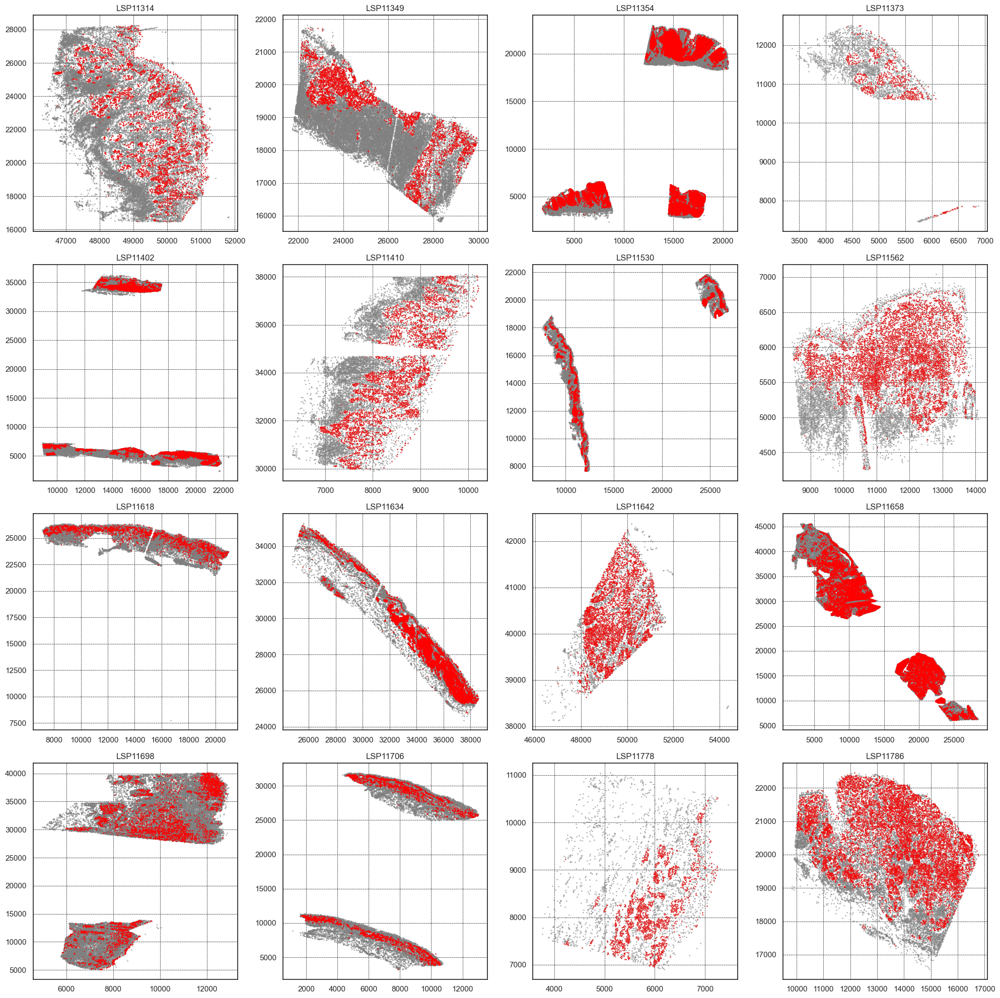

In [17]:
# now plot it
import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = 'white'

# loop through the data
plots_per_row = 4
num_rows = len(imageidsDict.keys()) // plots_per_row + (len(imageidsDict.keys()) % plots_per_row >0)

# Create subplots
fig, axes = plt.subplots(num_rows, plots_per_row, figsize = (20, 5 * num_rows))

if num_rows > 1:
    axes = axes.flatten()

for i, key in enumerate(imageidsDict):
    #print(i)
    adata = imageidsDict[key]
    #adata.obs["tumor"] = False
    #adata.obs.loc[adata.obs.phenotype == "Melanocytes", "tumor"] = True
    # now plot it
    #print(key)
    #fig = plt.figure(figsize = (10, 10), facecolor = "white")
    ax = axes[i]
    ax.set_facecolor("white")
    #ax = fig.add_subplot(111, facecolor = "white")
    ax.scatter(*zip(*adata.obs[["X_centroid", "Y_centroid"]].to_numpy()),
               s = 1, color = "grey", alpha = 0.5)
    tmp = adata[adata.obs.tumor]
    ax.scatter(*zip(*tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()), 
           s=1, color="red", alpha=0.5)
    ax.grid(color='black', linestyle='--', linewidth=0.5)
    
    

    ax.set_title(key)
    #plt.show()

plt.tight_layout()

Trying to set attribute `.obs` of view, copying.


number of communities: 1


Trying to set attribute `.obs` of view, copying.


number of communities: 2


Trying to set attribute `.obs` of view, copying.


number of communities: 3


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


number of communities: 2
number of communities: 7


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


number of communities: 1
number of communities: 2


Trying to set attribute `.obs` of view, copying.
Trying to set attribute `.obs` of view, copying.


number of communities: 1
number of communities: 1


Trying to set attribute `.obs` of view, copying.


number of communities: 4


Trying to set attribute `.obs` of view, copying.


number of communities: 1


Trying to set attribute `.obs` of view, copying.


number of communities: 11


Trying to set attribute `.obs` of view, copying.


number of communities: 9


Trying to set attribute `.obs` of view, copying.


number of communities: 2


Trying to set attribute `.obs` of view, copying.


number of communities: 1


Trying to set attribute `.obs` of view, copying.


number of communities: 1


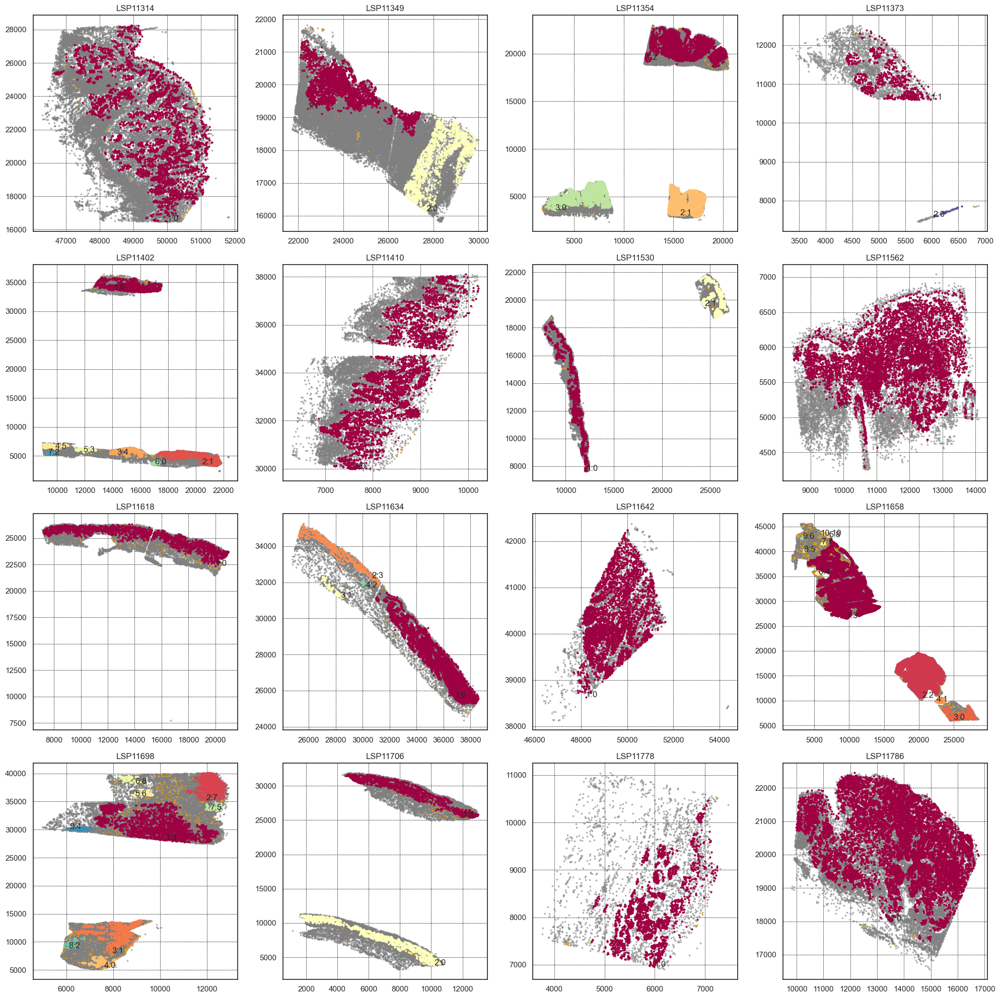

In [18]:
# generate a for loop to define the region to each plot
#import matplotlib as mpl
#mpl.rcParams['figure.facecolor'] = 'white'

# loop through the data
plots_per_row = 4
num_rows = len(imageidsDict.keys()) // plots_per_row + (len(imageidsDict.keys()) % plots_per_row >0)

# Create subplots
fig, axes = plt.subplots(num_rows, plots_per_row, figsize = (20, 5 * num_rows))

if num_rows > 1:
    axes = axes.flatten()

keys_for_process = list(imageidsDict.keys())


for i, key in enumerate(keys_for_process):
    markers_of_interest = ["tumor"]
    communitycolumn = "COI_community"
    markersize  = 2

    #print(i)
    adata = imageidsDict[key]
    #adata.obs["tumor"] = False
    #adata.obs.loc[adata.obs.phenotype == "Melanocytes", "tumor"] = True
    ret = spc.spatial.getCommunities(adata, markers_of_interest,
                                     eps = 400,
                                     newcolumn = communitycolumn)
    
    print("number of communities:", len(ret[0]))
    labels_sorted = ret[0]
    db = ret[1]
    plot_first_n_clusters = 10
    adata_tmp = adata[adata.obs[communitycolumn] > -2]
    X = adata_tmp.obs[["X_centroid", "Y_centroid"]].to_numpy()
    labels = db.labels_
    unique_labels = set(labels)
    core_samples_mask = np.zeros_like(labels, dtype=bool)
    core_samples_mask[db.core_sample_indices_] = True
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
    ax = axes[i]
    ax.set_facecolor("white")
    #ax = fig.add_subplot(111, facecolor = "white")
    ax.scatter(*zip(*adata.obs[["X_centroid", "Y_centroid"]].to_numpy()),
               s = 3, color = "grey", alpha = 0.5)
    ax.scatter(X[:,0], X[:,1], alpha=0.5, color="orange", s=markersize/2)
    ax.grid(color='black', linestyle='--', linewidth=0.5)
    # clusters
    idx = 0   
    for npoints, k in labels_sorted:

        if k == -1:
            continue
        if idx >= plot_first_n_clusters:
            break
        col = colors[idx] 
        class_member_mask = labels == k
        mask = class_member_mask & core_samples_mask
        xy = X[mask]
        ax.plot(xy[:, 0],xy[:, 1],
                 "o",
                 markerfacecolor=tuple(col),
                 markeredgecolor=tuple(col),
                 markersize=markersize,)
        ax.annotate(str(idx+1)+":"+str(k), (xy[0, 0], xy[0, 1]))
        idx += 1
    ax.set_title(key)
    #plt.show()

plt.tight_layout()

In [19]:
# define clustering list
communityIndexDict = {"LSP11314": [0],
                      "LSP11349": [0, 1],
                      "LSP11354": [0, 1, 2],
                      "LSP11373": [1], 
                      "LSP11402": [0, 1, 3, 4, 5, 6],
                      "LSP11410": [0],
                      "LSP11530": [1, 0], 
                      "LSP11562": [0], 
                      "LSP11618": [0], 
                      "LSP11634": [0, 3],
                      "LSP11642": [0], 
                      "LSP11658": [0, 2, 3],
                      "LSP11698": [0, 1, 2, 3],
                      "LSP11706": [0, 1],
                      "LSP11778": [0], 
                      "LSP11786": [0], 
                      }

communityIndexDict

{'LSP11314': [0],
 'LSP11349': [0, 1],
 'LSP11354': [0, 1, 2],
 'LSP11373': [1],
 'LSP11402': [0, 1, 3, 4, 5, 6],
 'LSP11410': [0],
 'LSP11530': [1, 0],
 'LSP11562': [0],
 'LSP11618': [0],
 'LSP11634': [0, 3],
 'LSP11642': [0],
 'LSP11658': [0, 2, 3],
 'LSP11698': [0, 1, 2, 3],
 'LSP11706': [0, 1],
 'LSP11778': [0],
 'LSP11786': [0]}

LSP11314#edges 1118
LSP11314#components 12
LSP11349#edges 513
LSP11349#components 3
LSP11354#edges 1446
LSP11354#components 9
LSP11373#edges 133
LSP11373#components 2
LSP11402#edges 1012
LSP11402#components 13
LSP11410#edges 525
LSP11410#components 3
LSP11530#edges 836
LSP11530#components 18
LSP11562#edges 261
LSP11562#components 1
LSP11618#edges 703
LSP11618#components 8
LSP11634#edges 713
LSP11634#components 4
LSP11642#edges 220
LSP11642#components 2
LSP11658#edges 4444
LSP11658#components 54
LSP11698#edges 968
LSP11698#components 21
LSP11706#edges 1052
LSP11706#components 15
LSP11778#edges 270
LSP11778#components 2
LSP11786#edges 591
LSP11786#components 1


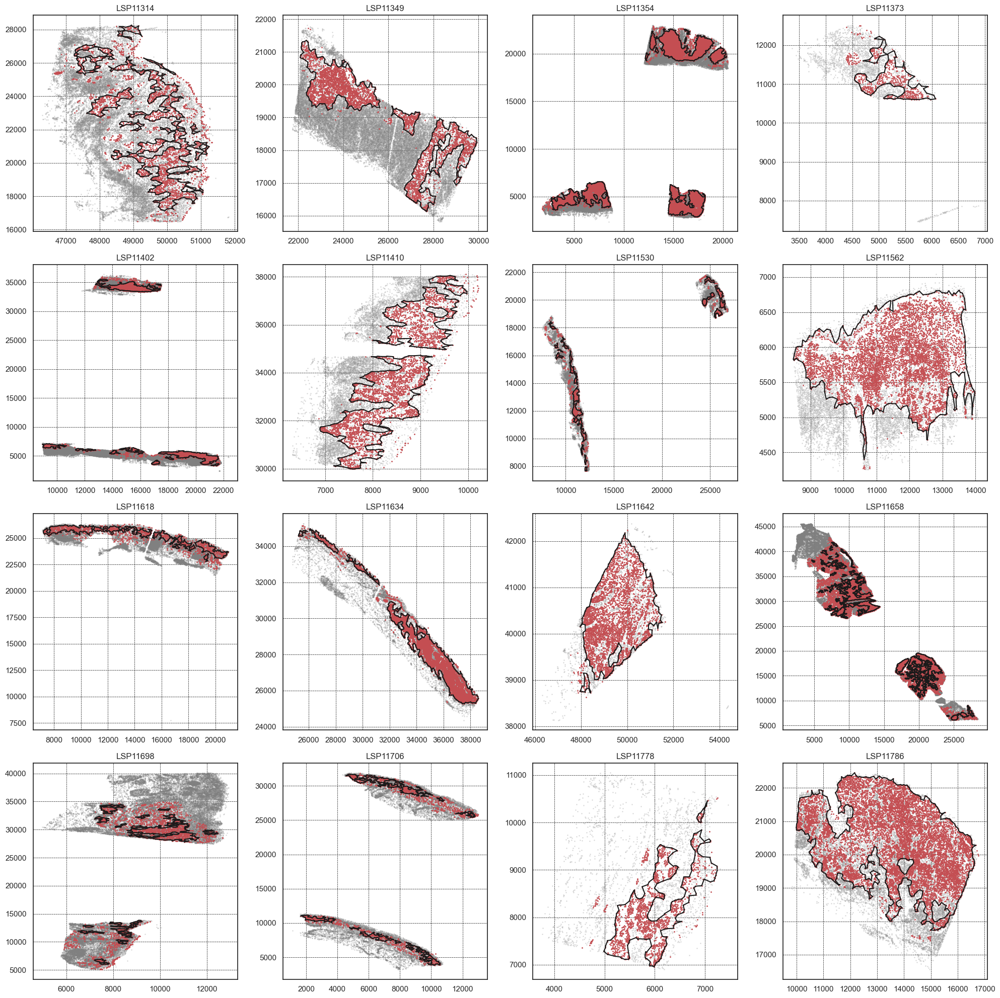

In [21]:
# now get boundary
# loop through the data
plots_per_row = 4
num_rows = len(imageidsDict.keys()) // plots_per_row + (len(imageidsDict.keys()) % plots_per_row >0)

# Create subplots
fig, axes = plt.subplots(num_rows, plots_per_row, figsize = (20, 5 * num_rows))

if num_rows > 1:
    axes = axes.flatten()

#keys_for_process = list(imageidsDict.keys())
#keys_for_process.remove("LSP11498")


for i, key in enumerate(imageids):
    adata = imageidsDict[key]
    communityIndexList = communityIndexDict[key]
    boundaries, boundaries_components = spc.spatial.getBoundary(adata, communitycolumn, communityIndexList, 
                                                                alpha = 80,
                                                                nedges_min = 20, 
                                                                nedges_out_min = 20
                                                                )
    print(key + "#edges", boundaries.shape[0])
    print(key + "#components", len(boundaries_components))

    

    markersize = 1
    ax = axes[i]
    ## all points
    ax.scatter(*zip(*adata.obs[["X_centroid", "Y_centroid"]].to_numpy()), 
           s=markersize, color="grey", alpha=0.2)
    # Points in selected commnities
    xy = adata.obs[adata.obs[communitycolumn].isin(communityIndexList)][["X_centroid", "Y_centroid"]].to_numpy()
    ax.scatter(xy[:,0], xy[:,1], s=markersize, color="r")
    ax.set_facecolor("white")
    ax.grid(color='black', linestyle='--', linewidth=0.5)
    # Bounds of points in selected commnities
    for edge in boundaries:
        ax.plot(edge[:, 0], edge[:, 1], color="k")
    
    ax.set_title(key)
    #plt.show()

plt.tight_layout()
#plt.ylim(44000, 55000)    
#plt.show()

Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out
Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out
Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out
Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out
Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out
Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out
Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out
Assigned points to region: OIn
Assigned points to region: 1Bi
Assigned points to region: 2Bo
Assigned points to region: 3Out


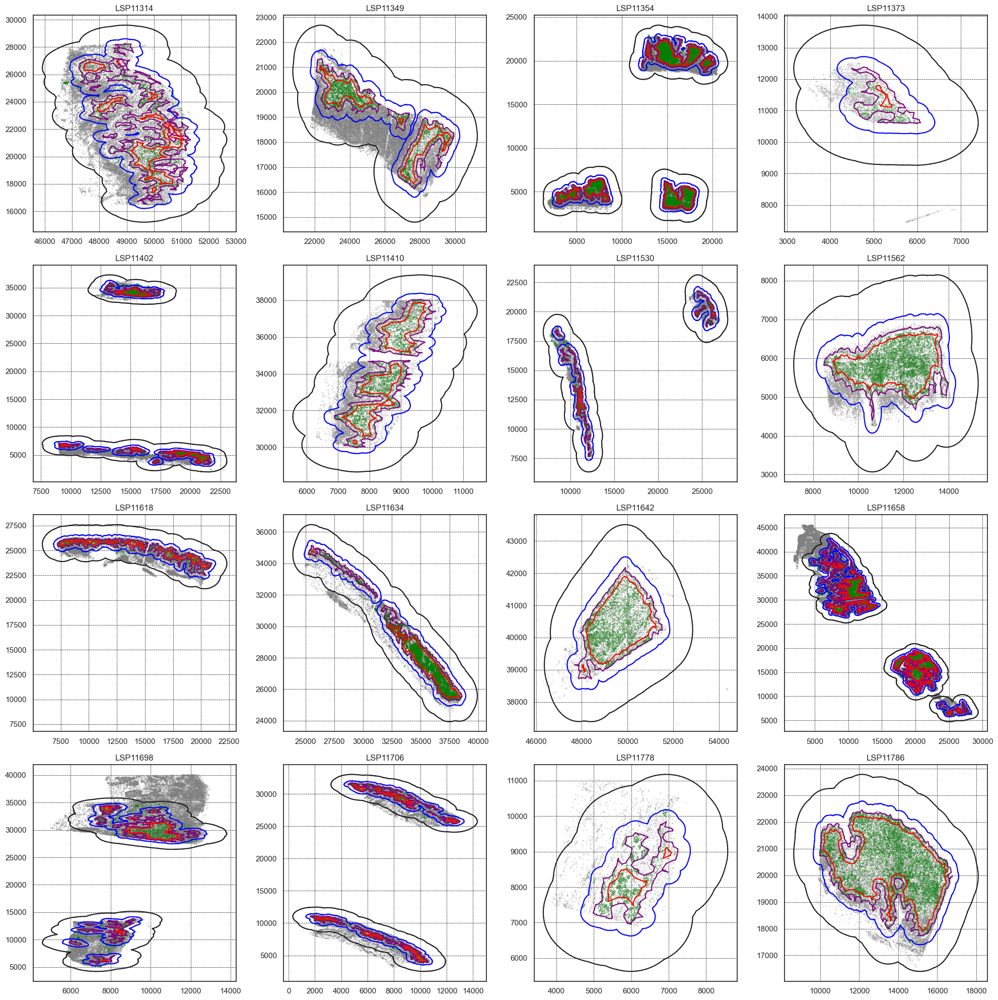

In [22]:
# now get the extended and shunken boundary
# now get boundary
# loop through the data
pointsize = 1
plots_per_row = 4

regions = ["OIn", "1Bi", "2Bo", "3Out"]


num_rows = len(imageidsDict.keys()) // plots_per_row + (len(imageidsDict.keys()) % plots_per_row >0)

# Create subplots
fig, axes = plt.subplots(num_rows, plots_per_row, figsize = (20, 5 * num_rows))

if num_rows > 1:
    axes = axes.flatten()

#keys_for_process = list(imageidsDict.keys())
#keys_for_process.remove("LSP11498")


for i, key in enumerate(imageids):
    adata = imageidsDict[key]

    communityIndexList = communityIndexDict[key]
    boundaries, boundaries_components = spc.spatial.getBoundary(adata, communitycolumn, communityIndexList, 
                                                                alpha = 100,
                                                                nedges_min = 20, 
                                                                nedges_out_min = 20)

    
    ROI_boundaries, ROI_boundary_components = spc.spatial.getExtendedBoundary(
        boundaries_components, offset = 800 / 0.6, minsize = 20 # For the example, the 1 pixel == 0.6 um
    )

    shrunken_boundaries, shrunken_boundary_components = spc.spatial.getShrunkenBoundary(
    boundaries_components, offset=100 / 0.6, minsize=20)

    extended_boundaries, extended_boundary_components = spc.spatial.getExtendedBoundary(
    boundaries_components, offset=200 / 0.6, minsize=20)

    # save the data 
    boundaries_list = [
        shrunken_boundary_components,
        boundaries_components,
        extended_boundary_components, 
        ROI_boundary_components
    ]

    spc.spatial.assignPointsToRegions(adata, boundaries_list, regions, assigncolumn = "region", default = "BG")

    imageidsDict[key] = adata

    ax = axes[i]
    ## all points
    ax.scatter(*zip(*adata.obs[["X_centroid", "Y_centroid"]].to_numpy()), 
               s=markersize, color="grey", alpha=0.2)
    
    # Points in selected commnities
    xy = adata.obs[adata.obs[communitycolumn].isin(communityIndexList)][["X_centroid", "Y_centroid"]].to_numpy()
    ax.scatter(xy[:,0], xy[:,1], s=markersize, color="green", alpha=0.2)
    ax.set_title(key)
    ax.set_facecolor("white")
    ax.grid(color='black', linestyle='--', linewidth=0.5)
    
    # Bounds of points in selected commnities
    for i, ed in enumerate(boundaries):
        if i == 0:
            ax.plot(ed[:, 0], ed[:, 1], color="purple", label="Tumor boundary")
        else:
            ax.plot(ed[:, 0], ed[:, 1], color="purple")
            
    for i, ed in enumerate(ROI_boundaries):
        if i == 0:
            ax.plot(ed[:, 0], ed[:, 1], color="k", label="ROI boundary")
        else:
            ax.plot(ed[:, 0], ed[:, 1], color="k")
            
    for i, ed in enumerate(extended_boundaries):
        if i == 0:
            ax.plot(ed[:, 0], ed[:, 1], color="blue", label="Extended tumor boundary")
        else:
            ax.plot(ed[:, 0], ed[:, 1], color="blue")
            
    for i, ed in enumerate(shrunken_boundaries):
        if i == 0:
            ax.plot(ed[:, 0], ed[:, 1], color="red", label="Shrunken tumor boundary")
        else:
            ax.plot(ed[:, 0], ed[:, 1], color="red")


plt.tight_layout()


In [ ]:
# replot the analysis only based on tumor margin
# now get the extended and shunken boundary
# now get boundary
# loop through the data
pointsize = 1
plots_per_row = 4

regions = ["OIn", "1Bi"]


num_rows = len(imageidsDict.keys()) // plots_per_row + (len(imageidsDict.keys()) % plots_per_row >0)

# Create subplots
fig, axes = plt.subplots(num_rows, plots_per_row, figsize = (20, 5 * num_rows))

if num_rows > 1:
    axes = axes.flatten()

for i, key in enumerate(imageids):
    adata = imageidsDict[key]

    communityIndexList = communityIndexDict[key]

    boundaries, boundaries_components = spc.spatial.getBoundary(adata, communitycolumn, communityIndexList, 
                                                                alpha = 100,
                                                                nedges_min = 20, 
                                                                nedges_out_min = 20)
    
    
    
    shrunken_boundaries, shrunken_boundary_components = spc.spatial.getShrunkenBoundary(boundaries_components, 
                                                                                        offset=100 / 0.6, 
                                                                                        minsize=20)
    
    

    ax = axes[i]
    ax.scatter(*zip(*adata.obs[["X_centroid", "Y_centroid"]].to_numpy()),
               s = markersize, color = "grey", alpha = 0.2)
    
    # Points in selected commnities
    xy = adata.obs[adata.obs[communitycolumn].isin(communityIndexList)][["X_centroid", "Y_centroid"]].to_numpy()
    ax.scatter(xy[:,0], xy[:,1], s=markersize, color="green", alpha=0.2)
    ax.set_title(key)
    ax.set_facecolor("white")
    ax.grid(color='black', linestyle='--', linewidth=0.5)

    
    # Bounds of points in selected commnities
    for i, ed in enumerate(boundaries):
        if i == 0:
            ax.plot(ed[:, 0], ed[:, 1], color="purple", label="Tumor boundary")
        else:
            ax.plot(ed[:, 0], ed[:, 1], color="purple")
    
    for i, ed in enumerate(shrunken_boundaries):
        
        if i == 0:
            ax.plot(ed[:, 0], ed[:, 1], color="red", label="Shrunken tumor boundary")
        else:
            ax.plot(ed[:, 0], ed[:, 1], color="red")

    plt.tight_layout()

            

In [31]:
RegionDict = {}
TumorDict = {}
for tumor in imageids:
    adataDF = imageidsDict[tumor].obs
    TumorDF = adataDF[adataDF["tumor"]]
    RegionDict[tumor] = adataDF[["imageid", "tumor_pheno", "region"]]
    TumorDict[tumor] = TumorDF[["imageid", "tumor_pheno", "region"]]


regionDFall = pd.concat([df.reset_index(drop = False) for df in RegionDict.values()])
tumorDFall = pd.concat([df.reset_index(drop = False) for df in TumorDict.values()])

In [34]:
tumorDFall.region.value_counts()

OIn     45380
1Bi     38372
2Bo     14117
BG       2902
3Out     2779
Name: region, dtype: int64

In [36]:
tumor_regions["tumor_pheno"].value_counts()

melanocytic         26483
transitionary        8813
undifferentiated     3076
Name: tumor_pheno, dtype: int64

In [41]:
# the regions we are looking for 0In and 1Bi
tumor_regions = tumorDFall[tumorDFall["region"].isin(["OIn", "1Bi"])]
tumor_regions["region"] = tumor_regions["region"].astype(str)
tumor_regions.region.value_counts()

/var/folders/t6/2_c4ymrj7b7b5fqx7h2mz8j00000gp/T/ipykernel_29082/870154694.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



OIn    45380
1Bi    38372
Name: region, dtype: int64

In [43]:
grouped_counts = tumor_regions.groupby(["imageid", "region", "tumor_pheno"]).size().reset_index(name = "counts")

# Calculate the total counts for each imageid-region combination for normalization
total_counts = grouped_counts.groupby(['imageid', 'region'])['counts'].transform('sum')

# Calculate the percentage
grouped_counts['percentage'] = (grouped_counts['counts'] / total_counts) * 100

grouped_counts

,imageid,region,tumor_pheno,counts,percentage
0,LSP11314,1Bi,melanocytic,1929,96.161515
1,LSP11314,1Bi,transitionary,77,3.838485
2,LSP11314,OIn,melanocytic,625,98.425197
3,LSP11314,OIn,transitionary,10,1.574803
4,LSP11349,1Bi,melanocytic,1744,95.352652
...,...,...,...,...,...
86,LSP11786,1Bi,transitionary,390,16.379672
87,LSP11786,1Bi,undifferentiated,76,3.191936
88,LSP11786,OIn,melanocytic,6248,91.131855
89,LSP11786,OIn,transitionary,504,7.351225


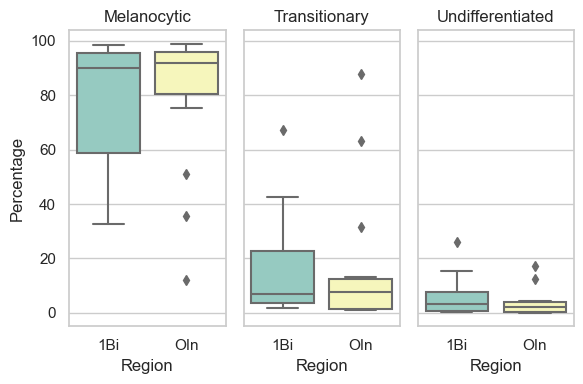

In [51]:
# use seaborn
sns.set_style("whitegrid")

# Create a figure and a set of subplots
fig, axes = plt.subplots(1, 3, figsize=(6, 4), sharey=True)

# Titles for each subplot
tumor_phenos = grouped_counts['tumor_pheno'].unique()
titles = ['Melanocytic', 'Transitionary', 'Undifferentiated']

for i, pheno in enumerate(tumor_phenos):
    # Filter the DataFrame for each tumor_pheno
    pheno_df = grouped_counts[grouped_counts['tumor_pheno'] == pheno]
    
    # Create the boxplot
    sns.boxplot(x='region', y='percentage', data=pheno_df, ax=axes[i], palette="Set3")
    
    # Enhance subplot
    axes[i].set_title(titles[i])
    axes[i].set_xlabel('Region')
    axes[i].set_ylabel('Percentage' if i == 0 else '')
    axes[i].set_xticklabels(['1Bi', 'OIn'])

# Adjust layout
plt.tight_layout()

# Show plot
plt.show()

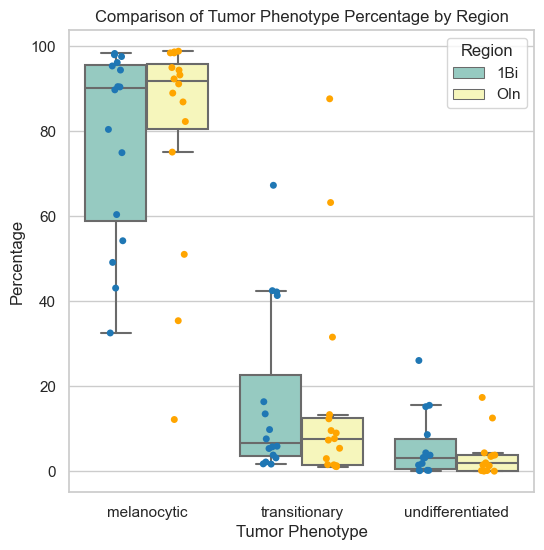

In [63]:
# Set the style of the visualization
sns.set(style="whitegrid")

custom_dot_colors = {"1Bi": "tab:blue", "OIn": "orange"}

# Create a boxplot and overlay individual data points
plt.figure(figsize=(6, 6))
sns.boxplot(x='tumor_pheno', y='percentage', hue='region', data=grouped_counts, palette="Set3", showfliers=False)

# Overlay individual points on the boxplot
# Set dodge=True to position points side by side for the two regions
sns.stripplot(x='tumor_pheno', y='percentage', hue='region', data=grouped_counts, palette= custom_dot_colors, 
              dodge=True, marker='o', alpha=1, jitter=True)

# Improve the legend to only show once
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[:2], labels[:2], title="Region")

plt.title('Comparison of Tumor Phenotype Percentage by Region')
plt.ylabel('Percentage')
plt.xlabel('Tumor Phenotype')

# Show the plot
plt.show()

In [ ]:
# set gate for the proliferation markers
spc.prep.setGate(adataAll, "Ki67", 0.5, marker_suffix = "_positive", debug = True)
spc.prep.setGate(adataAll, "MCM2", 0.5, marker_suffix = "_positive", debug = True)
spc.prep.setGate(adataAll, "pH3", 0.5, marker_suffix = "_positive", debug = True)
spc.prep.setGate(adataAll, "PCNA", 0.5, marker_suffix = "_positive", debug = True)


False    715102
True      28282
Name: Ki67_positive, dtype: int64
False    597208
True     146176
Name: MCM2_positive, dtype: int64
False    742479
True        905
Name: pH3_positive, dtype: int64
False    569529
True     173855
Name: PCNA_positive, dtype: int64


In [ ]:
# markers interested in SOX10, MART1, PMEL, SOX9, NGFR
adataAll.var_names
# this is only e41

spc.prep.setGate(adataAll, "SOX10", 0.5, marker_suffix = "_positive", debug = True)
spc.prep.setGate(adataAll, "PMEL", 0.5, marker_suffix = "_positive", debug = True)
spc.prep.setGate(adataAll, "SOX9", 0.5, marker_suffix = "_positive", debug = True)
spc.prep.setGate(adataAll, "MART1", 0.5, marker_suffix = "_positive", debug = True)

False    574977
True     168407
Name: SOX10_positive, dtype: int64
False    586216
True     157168
Name: PMEL_positive, dtype: int64
False    653257
True      90127
Name: SOX9_positive, dtype: int64
False    584257
True     159127
Name: MART1_positive, dtype: int64


In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, accuracy_score
from sklearn import preprocessing

selected_pred = ["VGP", "MIS", "RGP", "precursor", "normal"]

# now subset sox10 positive cells
sox10_data = adataAll[adataAll.obs["SOX10_positive"]]
sox10_data.obs

columns = ["PMEL_positive", "SOX9_positive", "MART1_positive", "ROI_major_category"]

pred_df = sox10_data.obs[columns]

features = ["PMEL_positive", "SOX9_positive", "MART1_positive"]
target = "ROI_major_category"

df_subset = pred_df[features + [target]]

df_subset["ROI_major_category"] = df_subset["ROI_major_category"].astype(str)


#df_subset = df_subset.drop("ROI_major_category", axis = 1)

df_subset = df_subset[df_subset["ROI_major_category"].isin(selected_pred)]
df_subset.ROI_major_category.value_counts()



VGP          103550
MIS           36053
RGP           22482
precursor      2511
normal         1219
Name: ROI_major_category, dtype: int64

In [ ]:
# convert boolean columns to integers
df_subset[features] = df_subset[features].astype(int)

# Convert categorical column to numeric
le = preprocessing.LabelEncoder()
df_subset[target] = le.fit_transform(df_subset[target])

# Split the data
X = df_subset[features]
y = df_subset[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Build the model
clf = DecisionTreeClassifier(random_state=42)
clf.fit(X_train, y_train)

# Make predictions and evaluate
predictions = clf.predict(X_test)
print(classification_report(y_test, predictions))
print("Accuracy:", accuracy_score(y_test, predictions))

              precision    recall  f1-score   support

           0       0.00      0.00      0.00     10813
           1       0.00      0.00      0.00      6705
           2       0.63      1.00      0.77     31106
           3       0.00      0.00      0.00       359
           4       0.00      0.00      0.00       762

    accuracy                           0.63     49745
   macro avg       0.13      0.20      0.15     49745
weighted avg       0.39      0.63      0.48     49745

Accuracy: 0.6253090762890743


/Users/yshi797/opt/anaconda3/envs/spatialcells/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yshi797/opt/anaconda3/envs/spatialcells/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.

/Users/yshi797/opt/anaconda3/envs/spatialcells/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning:

Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.



In [ ]:

from sklearn.tree import export_graphviz
import graphviz

# Visualize the decision tree
dot_data = export_graphviz(clf, out_file=None, 
                           feature_names=features,  
                           class_names=le.classes_,  
                           filled=True, rounded=True,  
                           special_characters=True)  
graph = graphviz.Source(dot_data)  
graph.render("decision_tree")  # This will save the tree as a PDF file

'decision_tree.pdf'

In [ ]:
# Assuming 'adataAll' is your original data and has been loaded correctly

# Filter for SOX10 positive cells
sox10_data = adataAll[adataAll.obs["SOX10_positive"]]

# Select relevant columns
columns = ["PMEL_positive", "SOX9_positive", "MART1_positive", "ROI_major_category"]
pred_df = sox10_data.obs[columns]

# Define features and target
features = ["PMEL_positive", "SOX9_positive", "MART1_positive"]
target = "ROI_major_category"

# Filter for selected predictions
selected_pred = ["VGP", "MIS", "RGP", "precursor", "normal"]
pred_df = pred_df[pred_df[target].isin(selected_pred)]

# Convert boolean columns to integers and target to string
pred_df[features] = pred_df[features].astype(int)
pred_df[target] = pred_df[target].astype(str)

# Encode target variable
label_encoder = LabelEncoder()
pred_df[target] = label_encoder.fit_transform(pred_df[target])

# Split the data
X = pred_df[features]
y = pred_df[target]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Build and train the decision tree model with max_depth
max_depth = 5  # You can adjust this value as needed
clf = DecisionTreeClassifier(max_depth=max_depth, random_state=42, class_weight = "balanced")
clf.fit(X_train, y_train)

# Make predictions and evaluate the model
predictions = clf.predict(X_test)
print("Classification Report:\n", classification_report(y_test, predictions))
print("Accuracy:", accuracy_score(y_test, predictions))

# Visualize the decision tree
dot_data = export_graphviz(clf, out_file=None, 
                           feature_names=features,  
                           class_names=label_encoder.classes_,  
                           filled=True, rounded=True,  
                           special_characters=True)  
graph = graphviz.Source(dot_data)  
graph.render("decision_tree")  # Saves the tree as a PDF file

NameError: name 'LabelEncoder' is not defined

In [ ]:
# Generate the dot data for the decision tree
dot_data = export_graphviz(
    clf, 
    out_file=None, 
    feature_names=features,  
    class_names=label_encoder.classes_,  
    filled=True, 
    rounded=True,  
    special_characters=True
)

# Customize the dot data string to set plot size
# 'size' is specified in inches (width, height)
dot_data = dot_data.replace('digraph Tree {', 'digraph Tree { size="12,12";')

# Create a graph from the dot data
graph = graphviz.Source(dot_data, format='pdf')

# Render the graph to a file
filename = graph.render(filename='decision_tree_customized')

# If you need to adjust the DPI, it can be done while opening the PDF in a viewer or through specific PDF processing tools
print(f"Decision tree diagram saved as {filename}")

Decision tree diagram saved as decision_tree_customized.pdf
